# Cluster T, S, DO data by machine learning

In [1]:
import sys
sys.path.append('/Users/ko389/Documents/Arctic_Water_Masses/Functions_general/')
import pandas as pd
import numpy as np
import xarray as xr
import gsw
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.path as mpath
import seaborn as sn
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean.cm as cmo
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib.colors import ListedColormap

**Load data**

In [14]:
# Load water mass, T, S, DO data
#arctic = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/water_masses_final.nc").to_dataframe()
arctic = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/WMA_fractions.nc").to_dataframe()


# Remove salinity < 0.5
#arctic = arctic[arctic['absolute_salinity'] >= 0.5]

# Just oxygen
#arctic_with_oxy = arctic.dropna(subset=['oxygen'])


/Users/ko389/miniconda3/envs/hydro_env_local/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/ko389/miniconda3/envs/hydro_env_local/lib/python3.12/site-packages/xarray/coding/times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


In [16]:
arctic[arctic['absolute_salinity'] < 0.5]

,ASW,MsPW,ACCW,wPW,NCW,MAW,BW,conservative_temp,absolute_salinity,latitude,depth,longitude,oxygen,datetime,source,nprof
index,,,,,,,,,,,,,,,,
34892,0.995119,0.0,0.004881,0.0,0.0,0.0,0.0,0.005,0.160,69.533,5.0,-133.280,388.293,1987-04-23,glodap,525.0
34937,0.995377,0.0,0.004623,0.0,0.0,0.0,0.0,0.026,0.110,69.545,5.0,-133.280,NaN,1986-09-10,glodap,538.0
848649,0.970822,0.0,0.029178,0.0,0.0,0.0,0.0,9.794,0.273,65.808,5.0,22.375,NaN,2009-05-21,udash,259284.0
899413,0.990877,0.0,0.009123,0.0,0.0,0.0,0.0,0.227,0.242,65.651,5.0,24.865,NaN,1995-04-03,udash,8231.0
982656,0.977986,0.0,0.022014,0.0,0.0,0.0,0.0,13.716,0.298,72.099,5.0,82.010,NaN,1995-08-25,udash,93496.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8168351,0.994413,0.0,0.005587,0.0,0.0,0.0,0.0,4.209,0.101,42.950,105.0,-122.088,NaN,2012-01-29,itp,26085.0
8168352,0.994413,0.0,0.005587,0.0,0.0,0.0,0.0,3.966,0.101,42.950,225.0,-122.089,NaN,2012-01-29,itp,26085.0
8168353,0.994413,0.0,0.005587,0.0,0.0,0.0,0.0,3.735,0.101,42.950,335.0,-122.088,NaN,2012-01-29,itp,26085.0


**Even out spatial and temporal distribution**

We target the ITP profiles for reducing spatial and temporal bias because they are the main source of spatial bias.

For ITP profiles:
1. Sample only 1500 profiles from each month
2. Sample only 0.008 profiles per km2 from each 10º longitude x 2º latitude bin


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/2986838596.py:38: RuntimeWarning: divide by zero encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/2986838596.py:38: RuntimeWarning: invalid value encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid


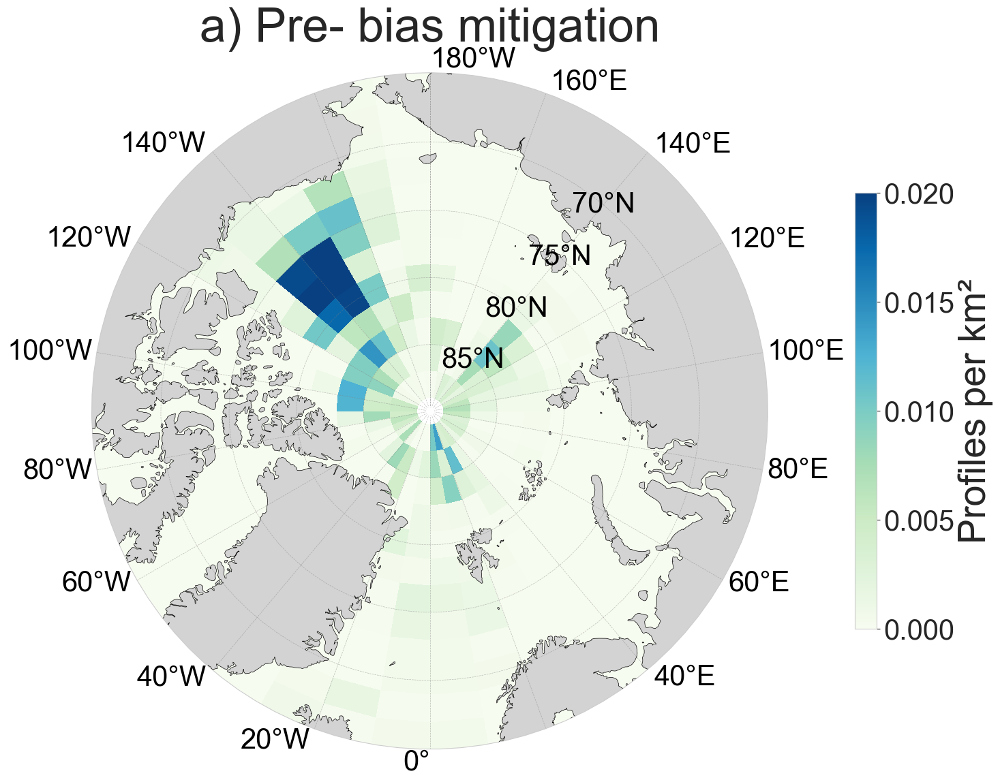

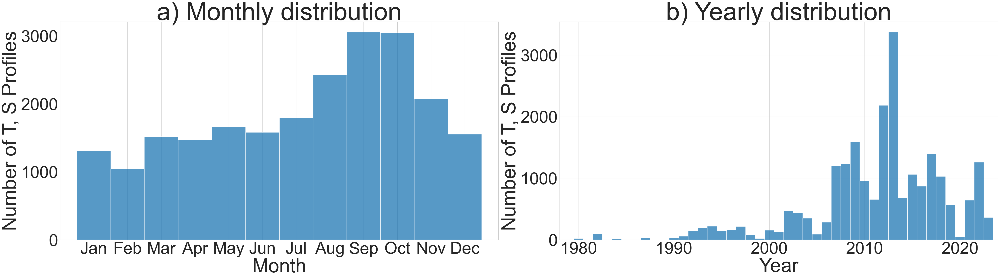

In [252]:
# First, plot spatial and temporal distribution of data

# Functions
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import datetime as dt
import calendar
def plot_spatial_dis_map_profile_density_counts(data, lon_bin_size, lat_bin_size):
    # Group by 'source' and 'nprof' to get unique profiles and their representative location
    grouped_data_lon_lat = data.groupby(['source', 'nprof'])[['longitude', 'latitude']].max().reset_index()

    # Define bin edges
    lon_bins = np.arange(-180, 180 + lon_bin_size, lon_bin_size)
    lat_bins = np.arange(65, 90 + lat_bin_size, lat_bin_size)

    # Bin profile locations into 2D histogram
    hist, lon_edges, lat_edges = np.histogram2d(
        grouped_data_lon_lat['longitude'],
        grouped_data_lon_lat['latitude'],
        bins=[lon_bins, lat_bins]
    )

    # Calculate area per bin in km²
    R = 6371  # Earth radius in km
    lon_bin_size_rad = np.deg2rad(lon_bin_size)
    lat_edges_rad = np.deg2rad(lat_edges)

    area_per_bin_lat = R**2 * lon_bin_size_rad * (np.sin(lat_edges_rad[1:]) - np.sin(lat_edges_rad[:-1]))  # shape (n_lat_bins,)
    # Repeat area along longitude dimension
    area_grid = np.tile(area_per_bin_lat[:, np.newaxis], (1, len(lon_bins)-1))  # shape (n_lat_bins, n_lon_bins)

    # Normalize histogram counts by bin area to get density (profiles per km²)
    hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid

    # Compute variance of normalized counts (density), excluding zero density bins
    #spatial_variance = np.var(hist_density[hist_density > 0])

    # Plotting setup
    fig = plt.figure(figsize=(16, 16))
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    ax.add_feature(cfeature.OCEAN, facecolor='white', zorder=1)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
    ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)
    ax.set_extent([-180, 180, 65, 90], ccrs.PlateCarree())

    # Circular boundary for polar plot
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Use pcolormesh to plot the density (profiles per km²)
    lon_grid, lat_grid = np.meshgrid(lon_edges, lat_edges)
    mesh = ax.pcolormesh(
        lon_grid, lat_grid, hist_density,
        transform=ccrs.PlateCarree(),
        cmap='GnBu',
        shading='auto', 
        vmin=0, vmax=0.02
    )

    cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('Profiles per km²', fontsize=40)
    cbar.ax.tick_params(labelsize=30)

    # Adjust colorbar position
    ax_size = ax.get_position()
    cbar.ax.set_position([ax_size.x1 + 0.08, ax_size.y0, 0.02, ax_size.height])

    # Annotate variance on the map
    """ax.text(
        0.5, -0.08,
        f'Spatial variance (profile density): {spatial_variance:.2e}',
        fontsize=40,
        transform=ax.transAxes,
        ha='center'
    )"""

    # Adjust longitude and latitude labels
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 20))
    gl.xformatter = LONGITUDE_FORMATTER
    gl.xlabel_style = {'size': 30, 'color': 'k', 'rotation': 0}
    gl.ylocator = mticker.FixedLocator(np.arange(65, 91, 5))
    gl.yformatter = LATITUDE_FORMATTER
    gl.ylabel_style = {'size': 30, 'color': 'k', 'rotation': 0}

    plt.title('a) Pre- bias mitigation', fontsize=50)

    plt.show()
def plot_temporal_dis(data):
    
    grouped_data = data.groupby(['source', 'nprof']).size().reset_index(name='profile_count')
    grouped_data_lon_lat = data.groupby(['source', 'nprof'])[['datetime']].max()
    grouped_data = pd.merge(grouped_data_lon_lat, grouped_data, on=['source', 'nprof'])
    
    # Extract month and year
    month = grouped_data['datetime'].dt.month
    year = grouped_data['datetime'].dt.year
        
    fig, axes = plt.subplots(1, 2, figsize=(50, 14))
    sn.set_style("whitegrid")

    # Plot histogram for 'month'
    sn.histplot(month, ax=axes[0], bins=range(int(month.min()), int(month.max()) + 1), binwidth=1, discrete=True)
    axes[0].set_xlabel('Month', fontsize=70)
    axes[0].set_ylabel('Number of T, S Profiles', fontsize=70)
    axes[0].set_title('a) Monthly distribution', fontsize=90)
    axes[0].grid(True)
    axes[0].set_xlim([0, 13])
    axes[0].set_xticks(range(1, 13))  # Set ticks from 1 to 12
    axes[0].set_xticklabels(calendar.month_abbr[1:], fontsize=60)  # Use abbreviated month names ('Jan', 'Feb', ...)
    axes[0].tick_params(axis='both', which='major', labelsize=60)  # Adjust tick label size

    # Plot histogram for 'year'
    sn.histplot(year, ax=axes[1], discrete=True)
    axes[1].set_xlabel('Year', fontsize=70)
    axes[1].set_xlim([1978,2024])
    axes[1].set_ylabel('Number of T, S Profiles', fontsize=70)
    axes[1].set_title('b) Yearly distribution', fontsize=90)
    axes[1].grid(True)
    axes[1].tick_params(axis='both', which='major', labelsize=60)  # Adjust tick label size

    plt.tight_layout()
    plt.show()

# Call functions
plot_spatial_dis_map_profile_density_counts(arctic_with_oxy, lon_bin_size=10, lat_bin_size=2)
plot_temporal_dis(arctic_with_oxy)

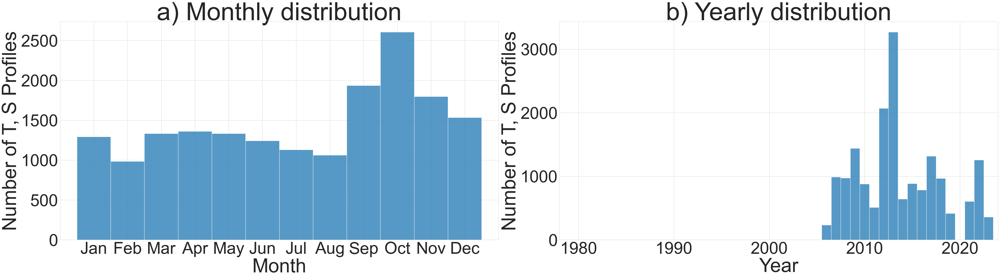

In [143]:
# Temporal distribution of ITP

plot_temporal_dis(arctic_with_oxy[arctic_with_oxy['source']=='itp'])

In [3]:
# 1. Sample only 1500 ITP profiles from each month to remove summer bias in ITP profiles, whilst not removing valuable non-ITP profiles.
# We can't afford to to this for non-ITP profiles because there is a large spatial bias towards ITP region, and very limited data in non-ITP regions.

import numpy as np
import pandas as pd

# Add month column if not present
arctic_with_oxy['month'] = arctic_with_oxy['datetime'].dt.month

# List to store sampled monthly data (ITP only)
sampled_profiles = []

# Loop over months, sampling only ITP profiles
for month in arctic_with_oxy['month'].unique():
    # Filter ITP profiles for this month
    itp_profs_in_month = arctic_with_oxy.loc[
        (arctic_with_oxy['month'] == month) & (arctic_with_oxy['source'] == 'itp'),
        ['source', 'nprof']
    ].drop_duplicates()

    n_available = len(itp_profs_in_month)
    n_sample = min(n_available,  1500)  # sample up to 2000 profiles or fewer if not enough

    # Sample without replacement
    sampled_indices = np.random.choice(itp_profs_in_month.index, n_sample, replace=False)
    sampled_profs = itp_profs_in_month.loc[sampled_indices]

    # Select all rows matching the sampled (source, nprof) pairs
    sampled_month_data = pd.merge(
        arctic_with_oxy,
        sampled_profs,
        on=['source', 'nprof'],
        how='inner'
    )

    sampled_profiles.append(sampled_month_data)

# Combine all sampled ITP profiles from all months
sampled_itp_data = pd.concat(sampled_profiles).reset_index(drop=True)

# Now combine sampled ITP profiles with non-ITP data untouched
non_itp_data = arctic_with_oxy.loc[arctic_with_oxy['source'] != 'itp']

sampled_df = pd.concat([sampled_itp_data, non_itp_data]).sort_index().reset_index(drop=True)


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/959340723.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arctic_with_oxy['month'] = arctic_with_oxy['datetime'].dt.month


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: divide by zero encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: invalid value encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/Users/ko389/miniconda3/envs/hydro_env_local/lib/python3.12/site-packages/numpy/core/_methods.py:173: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


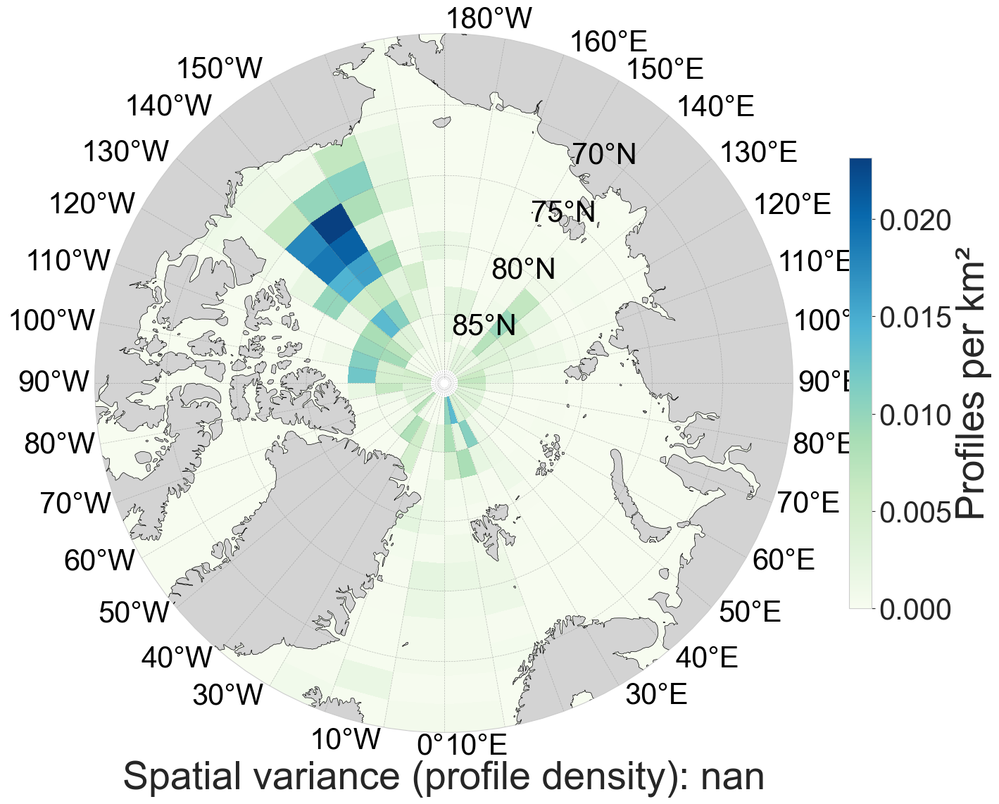

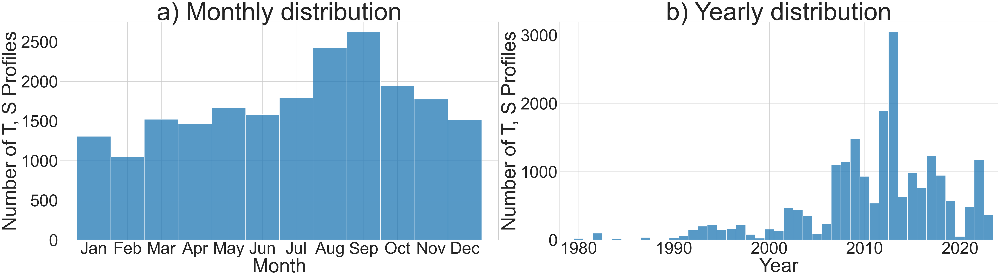

In [145]:
# Update look at spatial and temporal distribution
plot_spatial_dis_map_profile_density_counts(sampled_df, lon_bin_size=10, lat_bin_size=2)
plot_temporal_dis(sampled_df)


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: divide by zero encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: invalid value encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/Users/ko389/miniconda3/envs/hydro_env_local/lib/python3.12/site-packages/numpy/core/_methods.py:173: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


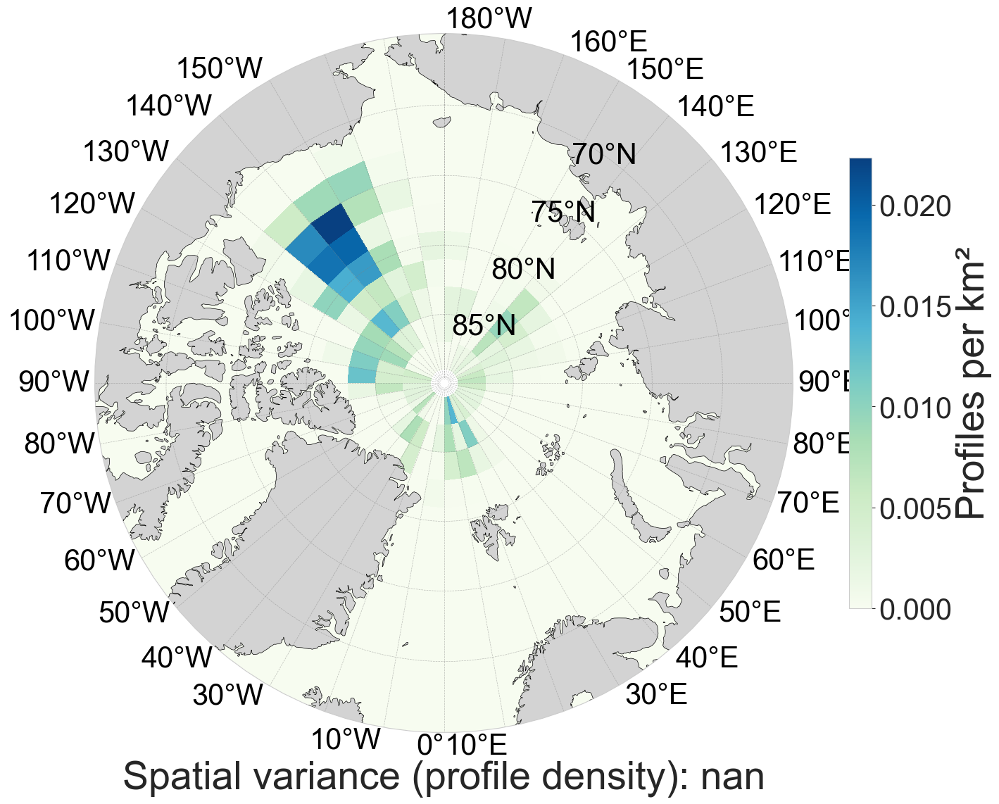

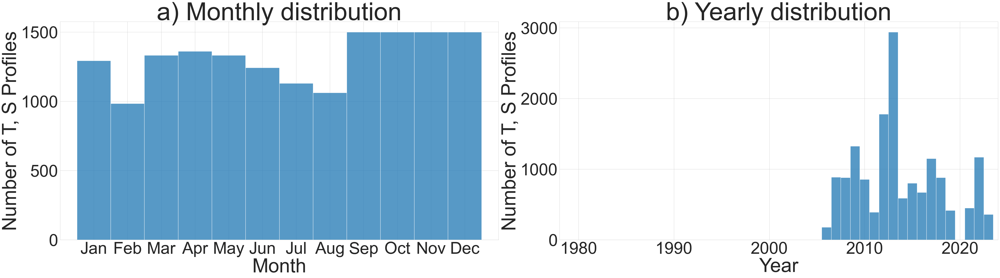

In [146]:
# Updated temporal and spatial distribution of ITP profiles
plot_spatial_dis_map_profile_density_counts(sampled_df[sampled_df['source']=='itp'], lon_bin_size=10, lat_bin_size=2)
plot_temporal_dis(sampled_df[sampled_df['source']=='itp'])

In [4]:
import numpy as np
import pandas as pd

# Assume sampled_df has 'latitude', 'longitude', 'source', 'nprof'

# Define bin edges same as plotting function
lon_bin_size = 10
lat_bin_size = 2
lon_bins = np.arange(-180, 180 + lon_bin_size, lon_bin_size)
lat_bins = np.arange(65, 90 + lat_bin_size, lat_bin_size)

# Group unique profile positions
grouped_data = sampled_df.groupby(['source', 'nprof'])[['longitude', 'latitude']].max().reset_index()

# Bin the data (get bin indices for each profile)
lon_bin_idx = np.digitize(grouped_data['longitude'], lon_bins) - 1
lat_bin_idx = np.digitize(grouped_data['latitude'], lat_bins) - 1

# Remove any out-of-bounds bin indices
valid_mask = (lon_bin_idx >= 0) & (lon_bin_idx < len(lon_bins)-1) & (lat_bin_idx >= 0) & (lat_bin_idx < len(lat_bins)-1)
grouped_data = grouped_data[valid_mask]
lon_bin_idx = lon_bin_idx[valid_mask]
lat_bin_idx = lat_bin_idx[valid_mask]

# Calculate bin area per km²
R = 6371  # Earth radius in km
lon_bin_size_rad = np.deg2rad(lon_bin_size)
lat_edges_rad = np.deg2rad(lat_bins)
area_per_bin_lat = R**2 * lon_bin_size_rad * (np.sin(lat_edges_rad[1:]) - np.sin(lat_edges_rad[:-1]))
area_grid = np.tile(area_per_bin_lat[:, np.newaxis], (1, len(lon_bins)-1))  # shape (lat_bins-1, lon_bins-1)

# Count profiles per bin
hist = np.zeros((len(lat_bins)-1, len(lon_bins)-1))
for i in range(len(grouped_data)):
    hist[lat_bin_idx[i], lon_bin_idx[i]] += 1

# Calculate density (profiles per km²)
density = hist / area_grid

# Threshold in profiles/km²
density_threshold = 0.008  # adjust this as you wish

# Identify high-density bins (as tuple indices)
high_density_bins = np.argwhere(density > density_threshold)

# Now sub-sample profiles in those bins
sampled_bins = []
for lat_i, lon_i in high_density_bins:
    lat_min = lat_bins[lat_i]
    lat_max = lat_bins[lat_i+1]
    lon_min = lon_bins[lon_i]
    lon_max = lon_bins[lon_i+1]
    
    bin_mask = (
        (sampled_df['source'] == 'itp') &
        (sampled_df['latitude'] >= lat_min) & (sampled_df['latitude'] < lat_max) &
        (sampled_df['longitude'] >= lon_min) & (sampled_df['longitude'] < lon_max)
    )
    
    bin_data = sampled_df.loc[bin_mask]
    unique_profiles = bin_data['nprof'].unique()
    max_profiles = int(density_threshold * area_grid[lat_i, lon_i])  # convert back to max profiles
    
    num_to_sample = min(max_profiles, len(unique_profiles))
    sampled_profiles = np.random.choice(unique_profiles, size=num_to_sample, replace=False)
    sampled_bin_data = bin_data[bin_data['nprof'].isin(sampled_profiles)]
    
    sampled_bins.append(sampled_bin_data)

# Combine sampled bins
sampled_bins_combined = pd.concat(sampled_bins) if sampled_bins else pd.DataFrame(columns=sampled_df.columns)

# Remove all high-density bin data from original
combined_bin_mask = np.zeros(len(sampled_df), dtype=bool)
for lat_i, lon_i in high_density_bins:
    lat_min = lat_bins[lat_i]
    lat_max = lat_bins[lat_i+1]
    lon_min = lon_bins[lon_i]
    lon_max = lon_bins[lon_i+1]
    
    bin_mask = (
        (sampled_df['source'] == 'itp') &
        (sampled_df['latitude'] >= lat_min) & (sampled_df['latitude'] < lat_max) &
        (sampled_df['longitude'] >= lon_min) & (sampled_df['longitude'] < lon_max)
    )
    combined_bin_mask |= bin_mask

# Keep rest of data as is
rest_of_data = sampled_df.loc[~combined_bin_mask]

# Final combined dataframe
sampled_df_2 = pd.concat([sampled_bins_combined, rest_of_data]).sort_index().reset_index(drop=True)


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/170268723.py:38: RuntimeWarning: divide by zero encountered in divide
  density = hist / area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/170268723.py:38: RuntimeWarning: invalid value encountered in divide
  density = hist / area_grid


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: divide by zero encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/1385202242.py:38: RuntimeWarning: invalid value encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/Users/ko389/miniconda3/envs/hydro_env_local/lib/python3.12/site-packages/numpy/core/_methods.py:173: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


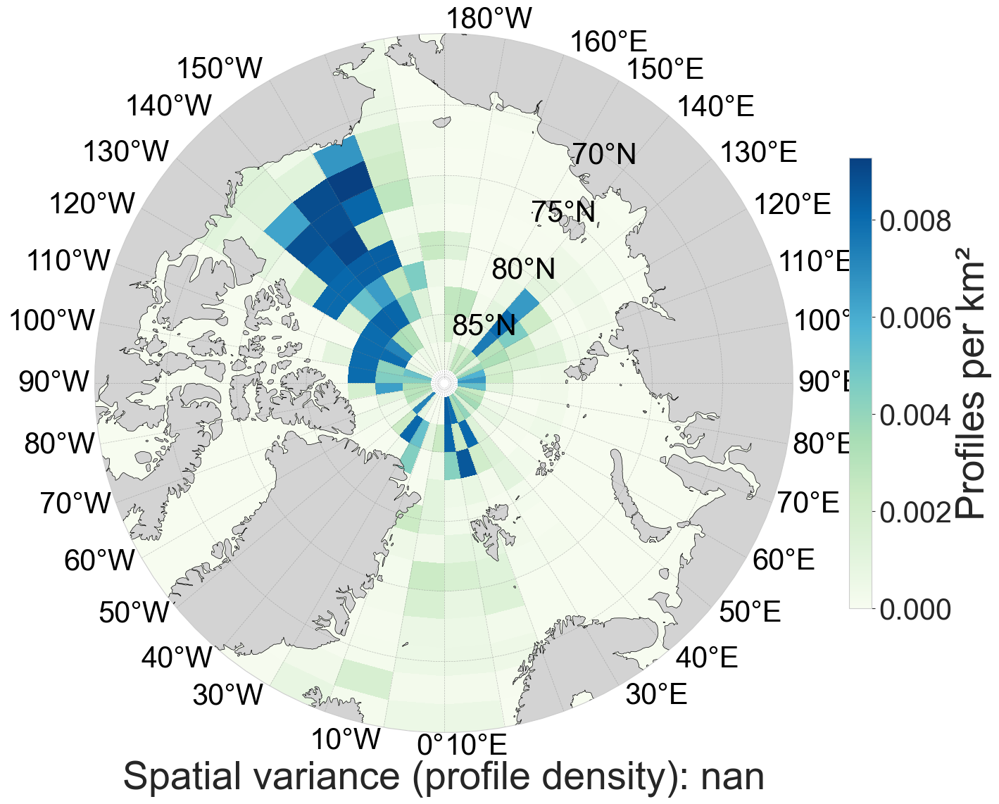

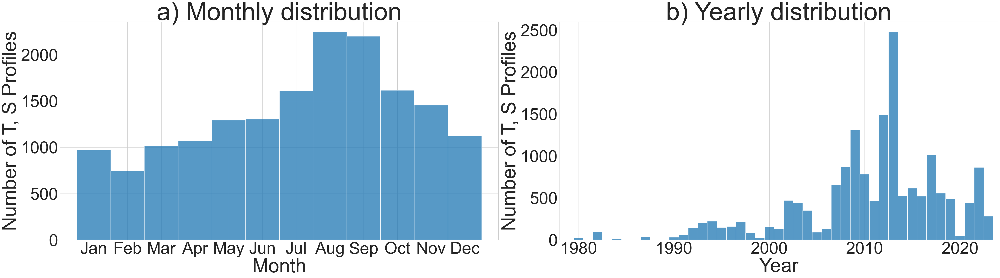

In [148]:
plot_spatial_dis_map_profile_density_counts(sampled_df_2, lon_bin_size=10, lat_bin_size=2)
plot_temporal_dis(sampled_df_2)

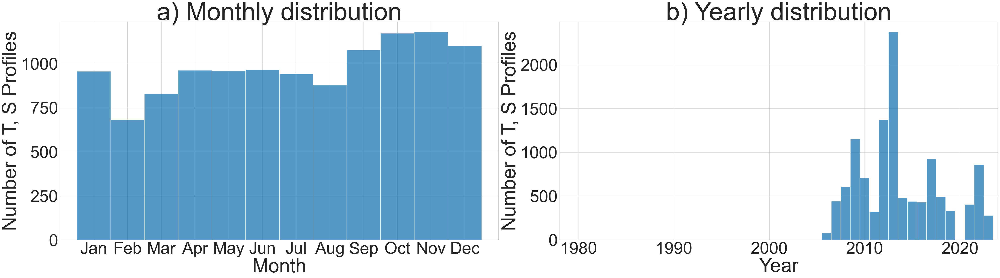

In [149]:
plot_temporal_dis(sampled_df_2[sampled_df_2['source']=='itp'])

/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/2253414644.py:36: RuntimeWarning: divide by zero encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_52414/2253414644.py:36: RuntimeWarning: invalid value encountered in divide
  hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid


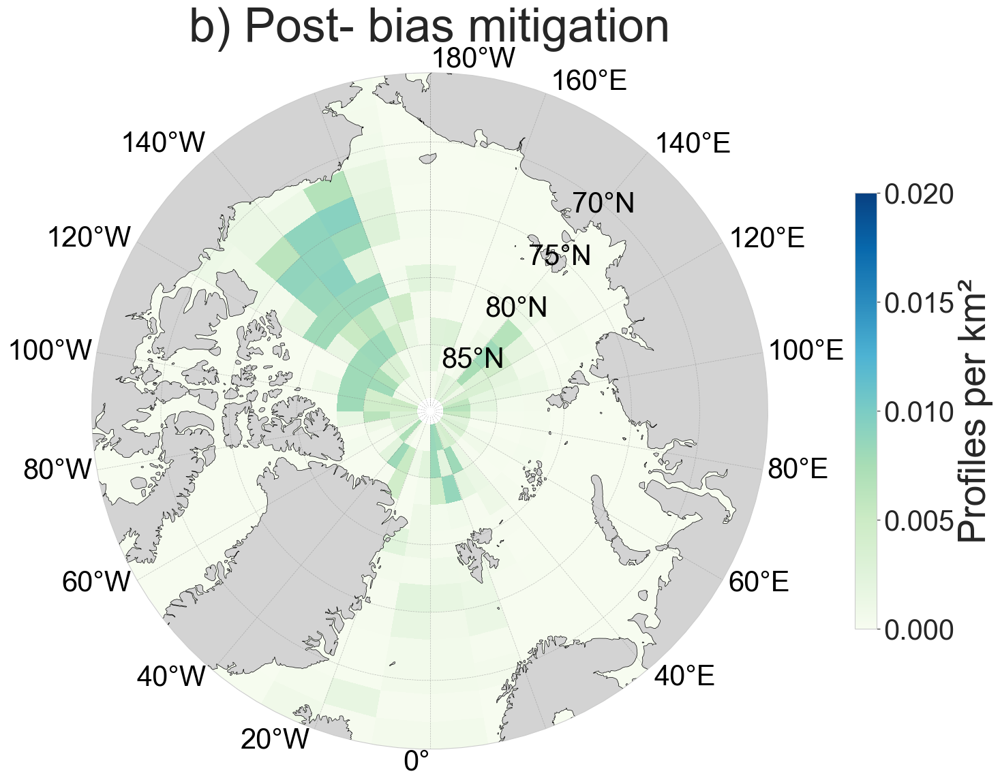

In [253]:
# Functions
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import datetime as dt
import calendar
def plot_spatial_dis_map_profile_density_counts(data, lon_bin_size, lat_bin_size):
    # Group by 'source' and 'nprof' to get unique profiles and their representative location
    grouped_data_lon_lat = data.groupby(['source', 'nprof'])[['longitude', 'latitude']].max().reset_index()

    # Define bin edges
    lon_bins = np.arange(-180, 180 + lon_bin_size, lon_bin_size)
    lat_bins = np.arange(65, 90 + lat_bin_size, lat_bin_size)

    # Bin profile locations into 2D histogram
    hist, lon_edges, lat_edges = np.histogram2d(
        grouped_data_lon_lat['longitude'],
        grouped_data_lon_lat['latitude'],
        bins=[lon_bins, lat_bins]
    )

    # Calculate area per bin in km²
    R = 6371  # Earth radius in km
    lon_bin_size_rad = np.deg2rad(lon_bin_size)
    lat_edges_rad = np.deg2rad(lat_edges)

    area_per_bin_lat = R**2 * lon_bin_size_rad * (np.sin(lat_edges_rad[1:]) - np.sin(lat_edges_rad[:-1]))  # shape (n_lat_bins,)
    # Repeat area along longitude dimension
    area_grid = np.tile(area_per_bin_lat[:, np.newaxis], (1, len(lon_bins)-1))  # shape (n_lat_bins, n_lon_bins)

    # Normalize histogram counts by bin area to get density (profiles per km²)
    hist_density = hist.T / area_grid  # transpose hist to (lat, lon) to align with area_grid

    # Compute variance of normalized counts (density), excluding zero density bins
    #spatial_variance = np.var(hist_density[hist_density > 0])

    # Plotting setup
    fig = plt.figure(figsize=(16, 16))
    ax = plt.axes(projection=ccrs.NorthPolarStereo())
    ax.add_feature(cfeature.OCEAN, facecolor='white', zorder=1)
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
    ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)
    ax.set_extent([-180, 180, 65, 90], ccrs.PlateCarree())

    # Circular boundary for polar plot
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Use pcolormesh to plot the density (profiles per km²)
    lon_grid, lat_grid = np.meshgrid(lon_edges, lat_edges)
    mesh = ax.pcolormesh(
        lon_grid, lat_grid, hist_density,
        transform=ccrs.PlateCarree(),
        cmap='GnBu',
        shading='auto', 
        vmin=0, vmax=0.02
    )

    cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('Profiles per km²', fontsize=40)
    cbar.ax.tick_params(labelsize=30)

    # Adjust colorbar position
    ax_size = ax.get_position()
    cbar.ax.set_position([ax_size.x1 + 0.08, ax_size.y0, 0.02, ax_size.height])

    # Annotate variance on the map
    """ax.text(
        0.5, -0.08,
        f'Spatial variance (profile density): {spatial_variance:.2e}',
        fontsize=40,
        transform=ax.transAxes,
        ha='center'
    )"""

    # Adjust longitude and latitude labels
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 20))
    gl.xformatter = LONGITUDE_FORMATTER
    gl.xlabel_style = {'size': 30, 'color': 'k', 'rotation': 0}
    gl.ylocator = mticker.FixedLocator(np.arange(65, 91, 5))
    gl.yformatter = LATITUDE_FORMATTER
    gl.ylabel_style = {'size': 30, 'color': 'k', 'rotation': 0}

    plt.title('b) Post- bias mitigation', fontsize=50)

    plt.show()

plot_spatial_dis_map_profile_density_counts(sampled_df_2, lon_bin_size=10, lat_bin_size=2)

**GMM: T and S clim**

In [49]:
"""# Now, do the same but for more balanced data: climatology or re-sampled observations
S = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/Climatology/woa23_decav_s00_01.nc", decode_times=False)
T = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/Climatology/woa23_decav_t00_01.nc", decode_times=False)

arctic_S = S.sel(lon=slice(-180, 180), lat=slice(60, 90))
arctic_T = T.sel(lon=slice(-180, 180), lat=slice(60, 90))

# Extract lon and lat arrays and create 2D meshgrid
lon, lat = np.meshgrid(arctic_T['lon'], arctic_T['lat'])

# Lists to hold all SA and CT values
SA_all = []
CT_all = []
lon_all = []
lat_all = []
depth_all = []

depth_levels=np.arange(0, 42)
time_index=0

for depth_level in depth_levels:
    temp = arctic_T['t_an'].isel(depth=depth_level, time=time_index)
    SP = arctic_S['s_an'].isel(depth=depth_level, time=time_index)
    p = arctic_T['depth'].isel(depth=depth_level).values  # scalar
    
    SA = gsw.SA_from_SP(SP.values, p, lon, lat)
    CT = gsw.CT_from_t(SA, temp.values, p)
    
    SA_all.append(SA.flatten())
    CT_all.append(CT.flatten())
    lon_all.append(lon.flatten())
    lat_all.append(lat.flatten())
    depth_all.append(np.full(SA.size, p))  # same size as SA 2D array flattened

# Concatenate lists
SA_all = np.concatenate(SA_all)
CT_all = np.concatenate(CT_all)
lon_all = np.concatenate(lon_all)
lat_all = np.concatenate(lat_all)
depth_all = np.concatenate(depth_all)

# Stack into a 2D array (shape: n_samples x 5)
X_clim = np.column_stack((CT_all, SA_all, lon_all, lat_all, depth_all))

# Remove any rows with NaNs (e.g. land points)
X_clim = X_clim[~np.isnan(X_clim).any(axis=1)]


# Build DataFrame
#X_clim = pd.DataFrame({
#    'absolute_salinity': SA_all,
#    'conservative_temp': CT_all,
#    'longitude': lon_all,
#    'latitude': lat_all,
#    'depth': depth_all
#})

# Drop NaN rows (usually at land points)
#X_clim = X_clim.dropna()"""


'# Now, do the same but for more balanced data: climatology or re-sampled observations\nS = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/Climatology/woa23_decav_s00_01.nc", decode_times=False)\nT = xr.open_dataset("/Users/ko389/Documents/GitHub/Arctic_water_masses/Data/Climatology/woa23_decav_t00_01.nc", decode_times=False)\n\narctic_S = S.sel(lon=slice(-180, 180), lat=slice(60, 90))\narctic_T = T.sel(lon=slice(-180, 180), lat=slice(60, 90))\n\n# Extract lon and lat arrays and create 2D meshgrid\nlon, lat = np.meshgrid(arctic_T[\'lon\'], arctic_T[\'lat\'])\n\n# Lists to hold all SA and CT values\nSA_all = []\nCT_all = []\nlon_all = []\nlat_all = []\ndepth_all = []\n\ndepth_levels=np.arange(0, 42)\ntime_index=0\n\nfor depth_level in depth_levels:\n    temp = arctic_T[\'t_an\'].isel(depth=depth_level, time=time_index)\n    SP = arctic_S[\'s_an\'].isel(depth=depth_level, time=time_index)\n    p = arctic_T[\'depth\'].isel(depth=depth_level).values  # scalar\n    

In [50]:

"""Ks = np.arange(1, 11)  # Try 1-10 clusters
bics = []
aics = []

for k in Ks:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X_clim[:,[0,1]])
    bics.append(gmm.bic(X_clim[:,[0,1]]))
    aics.append(gmm.aic(X_clim[:,[0,1]]))

# Plot BIC and AIC
plt.figure(figsize=(10,6))
plt.plot(Ks, bics, marker='o', label='BIC')
plt.plot(Ks, aics, marker='o', label='AIC')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Information Criterion')
plt.legend()
plt.title('Model Selection for GMM')
plt.grid(True)
plt.show()"""

"Ks = np.arange(1, 11)  # Try 1-10 clusters\nbics = []\naics = []\n\nfor k in Ks:\n    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)\n    gmm.fit(X_clim[:,[0,1]])\n    bics.append(gmm.bic(X_clim[:,[0,1]]))\n    aics.append(gmm.aic(X_clim[:,[0,1]]))\n\n# Plot BIC and AIC\nplt.figure(figsize=(10,6))\nplt.plot(Ks, bics, marker='o', label='BIC')\nplt.plot(Ks, aics, marker='o', label='AIC')\nplt.xlabel('Number of Clusters (K)')\nplt.ylabel('Information Criterion')\nplt.legend()\nplt.title('Model Selection for GMM')\nplt.grid(True)\nplt.show()"

In [51]:
"""# Fit the GMM
gmm = GaussianMixture(n_components=7, covariance_type='full', random_state=0)
gmm.fit(X_clim[:,[0,1]])
# Classify each point
labels = gmm.predict(X_clim[:,[0,1]])"""

"# Fit the GMM\ngmm = GaussianMixture(n_components=7, covariance_type='full', random_state=0)\ngmm.fit(X_clim[:,[0,1]])\n# Classify each point\nlabels = gmm.predict(X_clim[:,[0,1]])"

In [52]:
"""# Add labels to X
X_clusters_T_S_clim = np.hstack((X_clim, labels.reshape(-1, 1)))
X_clusters_T_S_clim = pd.DataFrame(X_clusters_T_S_clim, columns=['conservative_temp', 'absolute_salinity', 'longitude', 'latitude', 'depth', 'cluster'])"""

"# Add labels to X\nX_clusters_T_S_clim = np.hstack((X_clim, labels.reshape(-1, 1)))\nX_clusters_T_S_clim = pd.DataFrame(X_clusters_T_S_clim, columns=['conservative_temp', 'absolute_salinity', 'longitude', 'latitude', 'depth', 'cluster'])"

Results

In [ ]:
"""# Define SWT properties
values = {
    'ASW_T': -1.45, 'ASW_S': 27,
    'MsPW_T': 0.5, 'MsPW_S': 31,
    'sPW_T': 6, 'sPW_S': 31.2,
    'wPW_T': -1.5, 'wPW_S': 33.2,
    'NCW_T': 8, 'NCW_S': 35.4,
    'AW_T': 0, 'AW_S': 35.05,
    'BW_T': -1.8, 'BW_S': 34.45
}

# List of specific points
specific_points = [
    {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},
    {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},
    {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},
    {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},
    {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},
    {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},
    {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}
]

# Define plot grid
fig, ax = plt.subplots(1, 2, figsize=(60, 24)) 

# T-S scatter coloured by count (bivariate histogram)
hist = ax[0].hist2d(
    X_clim[:,1], X_clim[:,0],
    bins=(np.linspace(22,36,400), np.linspace(-2,14,400)),
    cmap='viridis', norm=LogNorm()
)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22,36,400), np.linspace(-2,14,400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contours = ax[0].contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=3)
ax[0].clabel(contours, inline=True, fontsize=80)

# Add SWT markers
for point in specific_points:
    ax[0].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000)
    ax[0].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22,36,400), 0, 0)
ax[0].plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=3, label="Freezing Line")

# Labels, limits, title
ax[0].set_xlabel('SA (g/kg)', fontsize=80)
ax[0].set_ylabel('CT (°C)', fontsize=80)
ax[0].set_xlim([22,36])
ax[0].set_ylim([-2,14])
ax[0].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)
ax[0].set_title('a) T-S plot colored by count', fontsize=80, pad=20)
cbar = plt.colorbar(hist[3], ax=ax[0])
cbar.set_label('Number of T, S data points', fontsize=80)
cbar.ax.tick_params(labelsize=80, width=2, length=10)

# T-S scatter coloured by cluster
optimal_clusters = len(np.unique(labels))
cmap = plt.get_cmap('tab10', optimal_clusters)

sc = ax[1].scatter(
    X_clim[:,1], X_clim[:,0],
    c=labels, s=50, cmap=cmap,
    vmin=0, vmax=optimal_clusters-1
)

cbar = plt.colorbar(sc, ax=ax[1], ticks=range(optimal_clusters))
cbar.set_label('Cluster', fontsize=80)
cbar.ax.tick_params(labelsize=60, width=2, length=10)

# Sigma0 density contours
contours = ax[1].contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=3)
ax[1].clabel(contours, inline=True, fontsize=70)

# Add SWT markers
for point in specific_points:
    ax[1].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000)
    ax[1].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
ax[1].plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=3, label="Freezing Line")

# Labels, limits, title
ax[1].set_xlabel('SA (g/kg)', fontsize=80)
ax[1].set_ylabel('CT (°C)', fontsize=80)
ax[1].set_xlim([22,36])
ax[1].set_ylim([-2,14])
ax[1].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)
ax[1].set_title('b) T-S plot colored by cluster', fontsize=80, pad=20)
ax[1].grid(False)

plt.tight_layout()
plt.show()"""

'# Define SWT properties\nvalues = {\n    \'ASW_T\': -1.45, \'ASW_S\': 27,\n    \'MsPW_T\': 0.5, \'MsPW_S\': 31,\n    \'ACCW_T\': 6, \'ACCW_S\': 31.2,\n    \'wPW_T\': -1.5, \'wPW_S\': 33.2,\n    \'NCW_T\': 8, \'NCW_S\': 35.4,\n    \'MAW_T\': 0, \'MAW_S\': 35.05,\n    \'BW_T\': -1.8, \'BW_S\': 34.45\n}\n\n# List of specific points\nspecific_points = [\n    {\'label\': \'A\', \'absolute_salinity\': values[\'ASW_S\'], \'conservative_temp\': values[\'ASW_T\'], \'water_mass\': \'Arctic Surface Water\'},\n    {\'label\': \'B\', \'absolute_salinity\': values[\'ACCW_S\'], \'conservative_temp\': values[\'ACCW_T\'], \'water_mass\': \'Alaskan Coastal Current Water\'},\n    {\'label\': \'C\', \'absolute_salinity\': values[\'MsPW_S\'], \'conservative_temp\': values[\'MsPW_T\'], \'water_mass\': \'summer Pacific Water\'},\n    {\'label\': \'D\', \'absolute_salinity\': values[\'wPW_S\'], \'conservative_temp\': values[\'wPW_T\'], \'water_mass\': \'winter Pacific Water\'},\n    {\'label\': \'E\', \'abso

In [54]:
"""def plot_cluster_maps(data, num_clusters):
    # Create figure with subplots for each cluster
    fig, axes = plt.subplots(2, 4, 
                             figsize=(60, 30),
                             subplot_kw={'projection': ccrs.NorthPolarStereo()})
    axes = axes.flatten()

    # Define the same colormap and normalization as T-S plot
    cmap = plt.get_cmap('tab10', num_clusters)
    norm = plt.Normalize(vmin=0, vmax=num_clusters-1)

    for cluster in range(num_clusters):
        ax = axes[cluster]

        # Subset data for this cluster
        cluster_data = data[data['cluster'] == cluster]

        # Map setup
        ax.add_feature(cfeature.OCEAN, facecolor='white', zorder=1)
        ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
        ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)
        ax.set_extent([-180, 180, 65, 90], ccrs.PlateCarree())

        # Circle boundary
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Plot cluster points with matching color
        sc = ax.scatter(
            cluster_data['longitude'],
            cluster_data['latitude'],
            c=[cmap(norm(cluster))],  # Color corresponding to this cluster
            s=8,
            marker='x',
            transform=ccrs.PlateCarree(),
            zorder=6
        )

        # Title and grid label formatting
        ax.set_title(f'Cluster {cluster}', fontsize=70, pad=20)
        gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 20))
        gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5))
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {'size': 40, 'color': 'k'}
        gl.ylabel_style = {'size': 40, 'color': 'k'}

    plt.tight_layout()
    plt.show()

# Plot the clusters on maps
plot_cluster_maps(X_clusters_T_S_clim, optimal_clusters)"""

"def plot_cluster_maps(data, num_clusters):\n    # Create figure with subplots for each cluster\n    fig, axes = plt.subplots(2, 4, \n                             figsize=(60, 30),\n                             subplot_kw={'projection': ccrs.NorthPolarStereo()})\n    axes = axes.flatten()\n\n    # Define the same colormap and normalization as T-S plot\n    cmap = plt.get_cmap('tab10', num_clusters)\n    norm = plt.Normalize(vmin=0, vmax=num_clusters-1)\n\n    for cluster in range(num_clusters):\n        ax = axes[cluster]\n\n        # Subset data for this cluster\n        cluster_data = data[data['cluster'] == cluster]\n\n        # Map setup\n        ax.add_feature(cfeature.OCEAN, facecolor='white', zorder=1)\n        ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)\n        ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)\n        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)\n        ax.set_extent([-180, 18

**GMM: 7 classes, T, S, DO obs**

In [ ]:
#X = arctic.sample(frac=0.1, random_state=42) 


In [5]:
X_with_T_S_DO = sampled_df_2[['conservative_temp', 'absolute_salinity', 'oxygen', 'longitude', 'latitude', 'depth']].dropna().values  # shape (N, x)
#X_with_T_S_DO = arctic[['conservative_temp', 'absolute_salinity', 'oxygen', 'longitude', 'latitude', 'depth']].dropna().values  # shape (N, x)

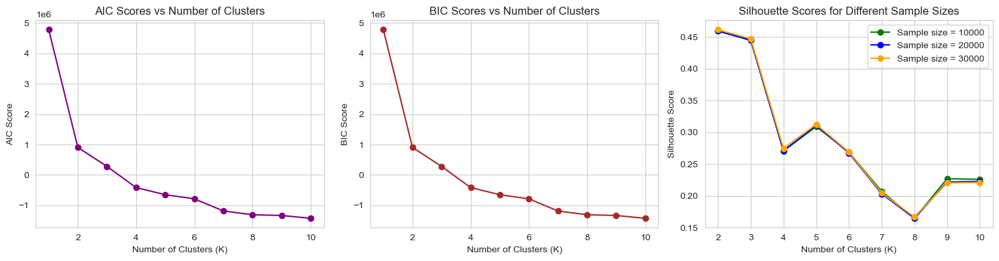

In [151]:
# Plot the AIC, BIC, and silhouette scores for different cluster numbers

import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

Ks = np.arange(1, 11)
sample_sizes = [10000, 20000, 30000]
# Data
X = X_with_T_S_DO[:, [0, 1, 2]]

# Standardize all features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# OPTIONAL: Apply relative weighting: reduce oxygen's contribution by 0.5×
weights = np.array([1.0, 1.0, 0.5])
X_weighted = X_scaled * weights

# Prepare data containers
aic_scores = []
bic_scores = []
silhouette_scores = {size: [] for size in sample_sizes}

for k in Ks:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X_weighted)
    aic_scores.append(gmm.aic(X_weighted))
    bic_scores.append(gmm.bic(X_weighted))

    for size in sample_sizes:
        if k >= 2:
            labels = gmm.predict(X_weighted)
            sil_score = silhouette_score(X_weighted, labels, sample_size=size, random_state=42)
            silhouette_scores[size].append(sil_score)
        else:
            silhouette_scores[size].append(np.nan)

# Plot all three metrics in one row
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

colors = ['green', 'blue', 'orange']

# AIC plot
axs[0].plot(Ks, aic_scores, marker='o', color='purple')
axs[0].set_title('AIC Scores vs Number of Clusters')
axs[0].set_xlabel('Number of Clusters (K)')
axs[0].set_ylabel('AIC Score')
axs[0].grid(True)

# BIC plot
axs[1].plot(Ks, bic_scores, marker='o', color='brown')
axs[1].set_title('BIC Scores vs Number of Clusters')
axs[1].set_xlabel('Number of Clusters (K)')
axs[1].set_ylabel('BIC Score')
axs[1].grid(True)

# Silhouette scores plot (multiple sample sizes)
for size, color in zip(sample_sizes, colors):
    axs[2].plot(Ks, silhouette_scores[size], marker='o', label=f'Sample size = {size}', color=color)

axs[2].set_title('Silhouette Scores for Different Sample Sizes')
axs[2].set_xlabel('Number of Clusters (K)')
axs[2].set_ylabel('Silhouette Score')
axs[2].grid(True)
axs[2].legend()

plt.tight_layout()
plt.show()

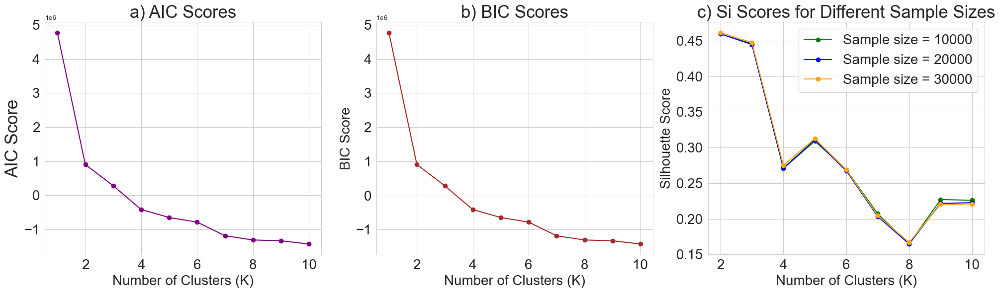

In [217]:
# Plot all three metrics in one row
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

colors = ['green', 'blue', 'orange']

# AIC plot
axs[0].plot(Ks, aic_scores, marker='o', color='purple')
axs[0].set_title('a) AIC Scores', fontsize=25)
axs[0].set_xlabel('Number of Clusters (K)', fontsize=20)
axs[0].set_ylabel('AIC Score', fontsize=25)
axs[0].tick_params(axis='both', which='major', labelsize=20)
axs[0].grid(True)

# BIC plot
axs[1].plot(Ks, bic_scores, marker='o', color='brown')
axs[1].set_title('b) BIC Scores', fontsize=25)
axs[1].set_xlabel('Number of Clusters (K)', fontsize=20)
axs[1].set_ylabel('BIC Score', fontsize=20)
axs[1].tick_params(axis='both', which='major', labelsize=20)
axs[1].grid(True)

# Silhouette scores plot (multiple sample sizes)
for size, color in zip(sample_sizes, colors):
    axs[2].plot(Ks, silhouette_scores[size], marker='o', label=f'Sample size = {size}', color=color)
    # fontsize=20

axs[2].set_title('c) Si Scores for Different Sample Sizes', fontsize=25)
axs[2].set_xlabel('Number of Clusters (K)', fontsize=20)
axs[2].set_ylabel('Silhouette Score', fontsize=20)
# grid fontsize=20 too
axs[2].tick_params(axis='both', which='major', labelsize=20)
axs[2].grid(True)
axs[2].legend(fontsize=20)

plt.tight_layout()
plt.show()

In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture

# Training data: subset used for clustering
X_train = X_with_T_S_DO[:, [0, 1, 2]]

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply relative weighting: e.g. 0.5× for oxygen (index 2)
weights = np.array([1.0, 1.0, 0.5])
X_train_weighted = X_train_scaled * weights

# Fit GMM
gmm = GaussianMixture(n_components=5, covariance_type='full', random_state=0)
gmm.fit(X_train_weighted)

# Now classify all points (bring back your full dataset)
all_data = arctic[['conservative_temp', 'absolute_salinity', 'oxygen', 'longitude', 'latitude', 'depth']].dropna().values
X_all = all_data[:, [0, 1, 2]]

# Standardize using the same scaler fitted on training data
X_all_scaled = scaler.transform(X_all)

# Apply the same weighting
X_all_weighted = X_all_scaled * weights

# Predict cluster labels and probabilities
labels = gmm.predict(X_all_weighted)
probs = gmm.predict_proba(X_all_weighted)

# 

In [7]:
# Add probabilities to X
X_clusters_T_S_DO = np.hstack((all_data, labels.reshape(-1, 1), probs))
X_clusters_T_S_DO = pd.DataFrame(X_clusters_T_S_DO, columns=['conservative_temp', 'absolute_salinity', 'oxygen', 'longitude', 'latitude', 'depth', 'cluster', 'cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4'])

**Results**

Distribution of clusters in T-S space

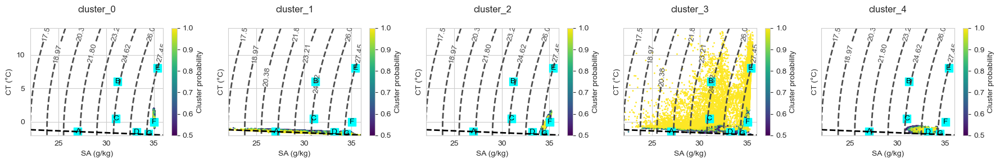

In [ ]:

def plot_T_S_water_mass(data,threshold):

    cluster_0 = data[data['cluster_0']>threshold]
    cluster_1 = data[data['cluster_1']>threshold]
    cluster_2 = data[data['cluster_2']>threshold]
    cluster_3 = data[data['cluster_3']>threshold]
    cluster_4 = data[data['cluster_4']>threshold]
    #cluster_5 = data[data['cluster_5']>threshold]
    #cluster_6 = data[data['cluster_6']>threshold]

    clusters = [
        (cluster_0, 'cluster_0'),
        (cluster_1, 'cluster_1'),
        (cluster_2, 'cluster_2'),
        (cluster_3, 'cluster_3'),
        (cluster_4, 'cluster_4')]
    
    # Create common grid and density contours
    SA, CT = np.meshgrid(np.linspace(22,36,400), np.linspace(-2,14,400))
    sigma0 = gsw.sigma0(SA, CT)
    levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
    CT_freezing = gsw.CT_freezing(np.linspace(22,36,400), 0, 0)

    fig, axes = plt.subplots(1, 5, figsize=(18, 3), sharey=True)

    # Loop through each water mass and generate its own figure
    for i, (cluster, label) in enumerate(clusters):
        sc = axes[i].scatter(
            cluster['absolute_salinity'], cluster['conservative_temp'],
            c=cluster[label], s=1, cmap='viridis', vmin=0.5, vmax=1
        )
        
        # Add sigma0 contours
        contours = axes[i].contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=2)
        axes[i].clabel(contours, inline=True)
        
        # Add SWT reference points
        values = {
        'ASW_T': -1.45, 'ASW_S': 27,
        'MsPW_T': 0.5, 'MsPW_S': 31,
        'sPW_T': 6, 'sPW_S': 31.2,
        'wPW_T': -1.5, 'wPW_S': 33.2,
        'NCW_T': 8, 'NCW_S': 35.4,
        'AW_T': 0, 'AW_S': 35.05,
        'BW_T': -1.8, 'BW_S': 34.45
    }

        # List of specific points
        specific_points = [
            {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},
            {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},
            {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},
            {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},
            {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},
            {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},
            {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}
        ]

        for point in specific_points:
            axes[i].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=100)
            axes[i].text(point['absolute_salinity'], point['conservative_temp'], point['label'],
                    ha='center', va='center', color='black')
        
        # Freezing line
        axes[i].plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=2, label="Freezing Line")
        
        # Plot settings
        axes[i].set_xlabel('SA (g/kg)')
        axes[i].set_ylabel('CT (°C)')
        axes[i].set_xlim([22, 36])
        axes[i].set_ylim([-2, 14])
        axes[i].tick_params(axis='both', which='major')
        axes[i].set_title(label, pad=20)
        cbar = plt.colorbar(sc, ax=axes[i])
        cbar.set_label('Cluster probability')
        
    plt.grid(False)
    plt.tight_layout()
    plt.show()


plot_T_S_water_mass(X_clusters_T_S_DO,0.5)


In [97]:
"""import seaborn as sns
# Plot histograms of depth for each cluster
cluster_0 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 0]
cluster_1 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 1]
cluster_2 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 2]
cluster_3 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 3]    
cluster_4 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 4]
#cluster_5 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 5]
#cluster_6 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 6]
# Create a figure with subplots for each cluster
fig, axes = plt.subplots(1, 5, figsize=(15, 3), sharey=True)
axes = axes.flatten()
# List of clusters and their labels
clusters = [
    (cluster_0, 'Cluster 0'),
    (cluster_1, 'Cluster 1'),
    (cluster_2, 'Cluster 2'),
    (cluster_3, 'Cluster 3'),
    (cluster_4, 'Cluster 4')]
    #(cluster_5, 'Cluster 5'),
    #(cluster_6, 'Cluster 6')]

# Loop through each cluster and create a histogram
for i, (cluster, label) in enumerate(clusters):
    sns.histplot(cluster['depth'], bins=30, kde=True, ax=axes[i], color='blue', stat='density')
    axes[i].set_title(label)
    axes[i].set_xlabel('Depth (m)')
    axes[i].set_ylabel('Density')
    axes[i].grid(False)
# Adjust layout
plt.tight_layout()
plt.show()"""

"import seaborn as sns\n# Plot histograms of depth for each cluster\ncluster_0 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 0]\ncluster_1 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 1]\ncluster_2 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 2]\ncluster_3 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 3]    \ncluster_4 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 4]\n#cluster_5 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 5]\n#cluster_6 = X_clusters_T_S_DO[X_clusters_T_S_DO['cluster'] == 6]\n# Create a figure with subplots for each cluster\nfig, axes = plt.subplots(1, 5, figsize=(15, 3), sharey=True)\naxes = axes.flatten()\n# List of clusters and their labels\nclusters = [\n    (cluster_0, 'Cluster 0'),\n    (cluster_1, 'Cluster 1'),\n    (cluster_2, 'Cluster 2'),\n    (cluster_3, 'Cluster 3'),\n    (cluster_4, 'Cluster 4')]\n    #(cluster_5, 'Cluster 5'),\n    #(cluster_6, 'Cluster 6')]\n\n# Loop through each cluster and create a histogram\nfor 

Spatial distribution of clusters - pan-Arctic sections

In [8]:
# Do this by combining 4 sections along the longitudes -140E, 0E, 140E, 0E. South of 80N, longitude rounded to nearest 5 degrees. North of 80N, rounded to nearest 10 degrees.

# section 1
rounded_5_longitude = np.round(X_clusters_T_S_DO['longitude'] / 5) * 5
rounded_5_longitude = (rounded_5_longitude + 180) % 360 - 180
section_1 = X_clusters_T_S_DO[((rounded_5_longitude == -140)) & (X_clusters_T_S_DO['latitude'] >= 70)& (X_clusters_T_S_DO['latitude'] <= 80)]
section_1 = section_1[['cluster_0','cluster_1','cluster_2','cluster_3','cluster_4','longitude','latitude','depth']]

# section 2
rounded_10_longitude = np.round(X_clusters_T_S_DO['longitude'] / 10) * 10
rounded_10_longitude = (rounded_10_longitude + 180) % 360 - 180
section_2 = X_clusters_T_S_DO[((rounded_10_longitude == -140)) & (X_clusters_T_S_DO['latitude'] > 80)]
section_2 = section_2[['cluster_0','cluster_1','cluster_2','cluster_3','cluster_4','longitude','latitude','depth']]

# section 3
rounded_10_longitude = np.round(X_clusters_T_S_DO['longitude'] / 10) * 10
rounded_10_longitude = (rounded_10_longitude + 180) % 360 - 180
section_3 = X_clusters_T_S_DO[((rounded_10_longitude == 0)) & (X_clusters_T_S_DO['latitude'] > 80)]
section_3 = section_3[['cluster_0','cluster_1','cluster_2','cluster_3','cluster_4','longitude','latitude','depth']]

# section 4
rounded_5_longitude = np.round(X_clusters_T_S_DO['longitude'] / 5) * 5
rounded_5_longitude = (rounded_5_longitude + 180) % 360 - 180
section_4 = X_clusters_T_S_DO[((rounded_5_longitude == 0)) & (X_clusters_T_S_DO['latitude'] >= 65)& (X_clusters_T_S_DO['latitude'] <= 80)]
section_4 = section_4[['cluster_0','cluster_1','cluster_2','cluster_3','cluster_4','longitude','latitude','depth']]

# Combine sections
section = pd.concat([section_1, section_2, section_3, section_4])

In [9]:
# Add a column of section distance from starting point: 70N, -140E

import gsw
def calculate_section_distances(data):
    section_distances = []
    
    for index, row in data.iterrows():
        lat = row['latitude']
        lon = row['longitude']
        depth = row['depth']
        
        # Calculate pressure from depth and latitude
        pressure = gsw.p_from_z(-depth, lat)
        
        # For Canada Basin section, calculate distance from 70N, -140E
        if lon < 120:
            # Distance from (70N, -140E) to the point
            distance = gsw.distance([lon, -140.0], [lat, 70.0], p=[pressure, pressure])
        
        # For Eurasian Basin section, calculate distance from 90N
        else:
            # Distance from (70N, -140E) to (90N, -140E) and then to the point
            distance_to_pole = gsw.distance([-140.0, -140.0], [70.0, 90.0])  # Distance between (70N, -140E) and (90N, -140E)
            distance_from_pole = gsw.distance([lon, -140.0], [lat, 90.0], p=[pressure, pressure])  # Distance from (90N, -140E) to the point
            
            # Total distance is the sum of these two distances
            distance = distance_to_pole + distance_from_pole
        
        # Append the calculated distance to the list
        section_distances.append(distance)
    
    return section_distances

section['section_distance_m'] = calculate_section_distances(section)

In [10]:
# Bin and average section data

# Create bins for section distance and depth
section_bins = np.arange(-11119, section['section_distance_m'].max() + 11119, 22238)
depth_bins = np.arange(5,1005,10)

# Bin the data
section['section_distance_bin'] = pd.cut(section['section_distance_m'], bins=section_bins)
section['depth_bin'] = pd.cut(section['depth'], bins=depth_bins)

# Now you can group by the bins and aggregate (for example, calculate mean AW_combined for each bin)
binned_data = section.groupby(['section_distance_bin', 'depth_bin']).agg({
    'cluster_0': 'mean',
    'cluster_1': 'mean',
    'cluster_2': 'mean',
    'cluster_3': 'mean',
    'cluster_4': 'mean',
    'longitude': 'mean',
    'latitude': 'mean'
}).reset_index()

# Replace bins with their midpoints
binned_data['section_distance_bin'] = binned_data['section_distance_bin'].apply(lambda x: x.mid)
binned_data['depth_bin'] = binned_data['depth_bin'].apply(lambda x: x.mid)

/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/4151270870.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  section_bins = np.arange(-11119, section['section_distance_m'].max() + 11119, 22238)
/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/4151270870.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned_data = section.groupby(['section_distance_bin', 'depth_bin']).agg({


/var/folders/zn/185xql1x357249zc9q1yjqvm0000gq/T/ipykernel_58219/2654488075.py:162: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


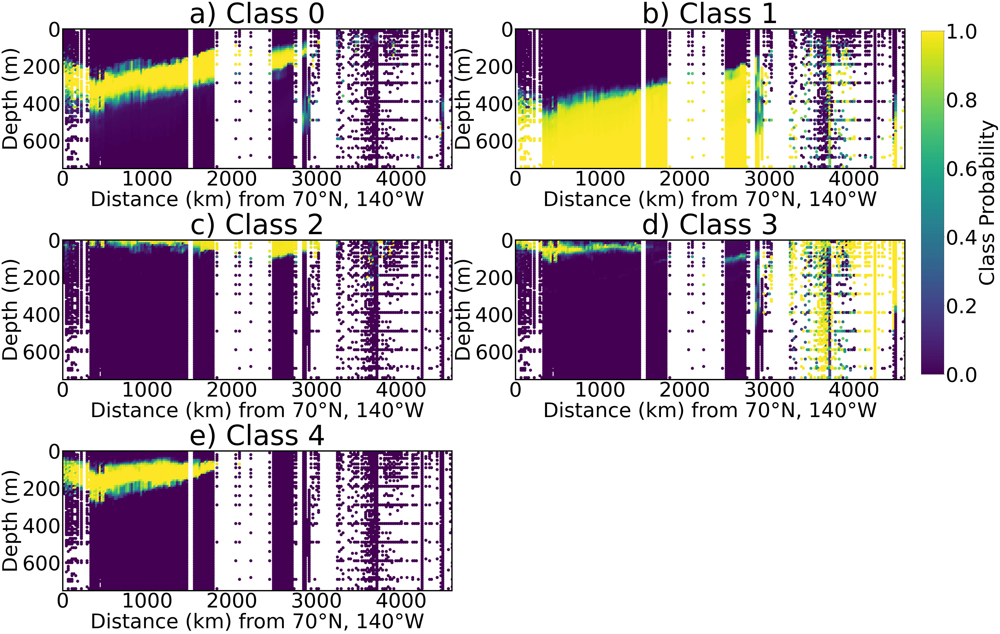

In [12]:
# Plot the binned section

# Create the plot with 2 subplots, stacked vertically
fig, ax = plt.subplots(3, 2, figsize=(50, 35))

# Scatter plot: section_distance_m vs depth, colored by AW_combined on the first subplot
sc1 = ax[0,0].scatter(binned_data['section_distance_bin'].astype(float)/1000, 
                    binned_data['depth_bin'], c=binned_data['cluster_0'], 
                    cmap='viridis', s=120, vmin=0, vmax=1)

# Invert the y-axis for the first subplot (so depth increases downward)
ax[0,0].invert_yaxis()

# Make grid lines thicker for the first subplot
for spine in ax[0,0].spines.values():
    spine.set_linewidth(5)

# Add labels and title for the first subplot
ax[0,0].set_xlabel('Distance (km) from 70°N, 140°W', fontsize=80)
ax[0,0].set_ylabel('Depth (m)', fontsize=80)

# Set y ticks every 200m
ax[0,0].set_yticks(np.arange(0, 800, 200))

# Limit y axis and x axis for the first subplot
ax[0,0].set_ylim([750, 0])
ax[0,0].set_xlim([0, 4.6e3])

# Set tick sizes for the first subplot
ax[0,0].tick_params(axis='both', which='major', labelsize=80)

# Add title
ax[0,0].set_title('a) Class 0', fontsize=110)

# Scatter plot: section_distance_m vs depth, colored by wPW on the second subplot
sc2 = ax[0,1].scatter(binned_data['section_distance_bin'].astype(float)/1000, 
                    binned_data['depth_bin'], c=binned_data['cluster_1'], 
                    cmap='viridis', s=120, vmin=0, vmax=1)

# Invert the y-axis for the second subplot (so depth increases downward)
ax[0,1].invert_yaxis()

# Make grid lines thicker for the second subplot
for spine in ax[0,1].spines.values():
    spine.set_linewidth(5)

# Add labels and title for the second subplot
ax[0,1].set_xlabel('Distance (km) from 70°N, 140°W', fontsize=80)
ax[0,1].set_ylabel('Depth (m)', fontsize=80)

# Set y ticks every 200m
ax[0,1].set_yticks(np.arange(0, 800, 200))

# Limit y axis and x axis for the second subplot
ax[0,1].set_ylim([750, 0])
ax[0,1].set_xlim([0, 4.6e3])

# Set tick sizes for the second subplot
ax[0,1].tick_params(axis='both', which='major', labelsize=80)

ax[0,1].set_title('b) Class 1', fontsize=110)

# Scatter plot: section_distance_m vs depth, colored by wPW on the second subplot
sc2 = ax[1,0].scatter(binned_data['section_distance_bin'].astype(float)/1000, 
                    binned_data['depth_bin'], c=binned_data['cluster_2'], 
                    cmap='viridis', s=120, vmin=0, vmax=1)

# Invert the y-axis for the second subplot (so depth increases downward)
ax[1,0].invert_yaxis()

# Make grid lines thicker for the second subplot
for spine in ax[1,0].spines.values():
    spine.set_linewidth(5)

# Add labels and title for the second subplot
ax[1,0].set_xlabel('Distance (km) from 70°N, 140°W', fontsize=80)
ax[1,0].set_ylabel('Depth (m)', fontsize=80)

# Set y ticks every 200m
ax[1,0].set_yticks(np.arange(0, 800, 200))

# Limit y axis and x axis for the second subplot
ax[1,0].set_ylim([750, 0])
ax[1,0].set_xlim([0, 4.6e3])

# Set tick sizes for the second subplot
ax[1,0].tick_params(axis='both', which='major', labelsize=80)

ax[1,0].set_title('c) Class 2', fontsize=110)


############Atlantic Water############

# Scatter plot: section_distance_m vs depth, colored by wPW on the second subplot
sc2 = ax[1,1].scatter(binned_data['section_distance_bin'].astype(float)/1000, 
                    binned_data['depth_bin'], c=binned_data['cluster_3'], 
                    cmap='viridis', s=120, vmin=0, vmax=1)

# Invert the y-axis for the second subplot (so depth increases downward)
ax[1,1].invert_yaxis()

# Make grid lines thicker for the second subplot
for spine in ax[1,1].spines.values():
    spine.set_linewidth(5)

# Add labels and title for the second subplot
ax[1,1].set_xlabel('Distance (km) from 70°N, 140°W', fontsize=80)
ax[1,1].set_ylabel('Depth (m)', fontsize=80)

# Set y ticks every 200m
ax[1,1].set_yticks(np.arange(0, 800, 200))

# Limit y axis and x axis for the second subplot
ax[1,1].set_ylim([750, 0])
ax[1,1].set_xlim([0, 4.6e3])

# Set tick sizes for the second subplot
ax[1,1].tick_params(axis='both', which='major', labelsize=80)

ax[1,1].set_title('d) Class 3', fontsize=110)

############Brine-enriched Water############

# Scatter plot: section_distance_m vs depth, colored by wPW on the second subplot
sc2 = ax[2,0].scatter(binned_data['section_distance_bin'].astype(float)/1000, 
                    binned_data['depth_bin'], c=binned_data['cluster_4'], 
                    cmap='viridis', s=120, vmin=0, vmax=1)

# Invert the y-axis for the second subplot (so depth increases downward)
ax[2,0].invert_yaxis()

# Make grid lines thicker for the second subplot
for spine in ax[2,0].spines.values():
    spine.set_linewidth(5)

# Add labels and title for the second subplot
ax[2,0].set_xlabel('Distance (km) from 70°N, 140°W', fontsize=80)
ax[2,0].set_ylabel('Depth (m)', fontsize=80)

# Set y ticks every 200m
ax[2,0].set_yticks(np.arange(0, 800, 200))

# Limit y axis and x axis for the second subplot
ax[2,0].set_ylim([750, 0])
ax[2,0].set_xlim([0, 4.6e3])

# Set tick sizes for the second subplot
ax[2,0].tick_params(axis='both', which='major', labelsize=80)

ax[2,0].set_title('e) Class 4', fontsize=110)

# Add colorb on the right side of the figure
cbar_ax = fig.add_axes([1.015, 0.41, 0.025, 0.54])  # [left, bottom, width, height]
cbar = fig.colorbar(sc1, cax=cbar_ax)
cbar.set_label('Class Probability', fontsize=80)
cbar.ax.tick_params(labelsize=80)

# Remove the unused 6th subplot (bottom right)
fig.delaxes(ax[2,1])

# Tight layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

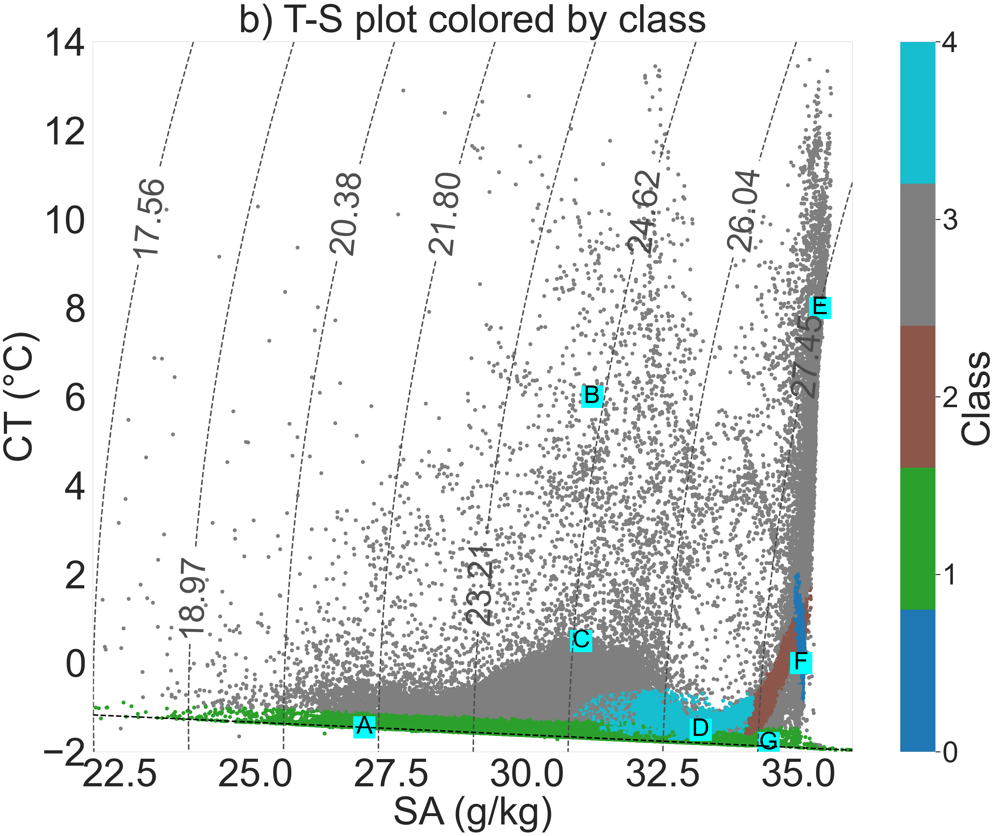

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import gsw

# Define SWT properties
values = {
    'ASW_T': -1.45, 'ASW_S': 27,
    'MsPW_T': 0.5, 'MsPW_S': 31,
    'sPW_T': 6, 'sPW_S': 31.2,
    'wPW_T': -1.5, 'wPW_S': 33.2,
    'NCW_T': 8, 'NCW_S': 35.4,
    'AW_T': 0, 'AW_S': 35.05,
    'BW_T': -1.8, 'BW_S': 34.45
}

# List of specific points
specific_points = [
    {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},
    {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},
    {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},
    {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},
    {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},
    {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},
    {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}
]

# Define plot grid
fig, ax = plt.subplots(figsize=(30, 24)) 

# T-S scatter coloured by cluster
optimal_clusters = len(np.unique(labels))
cmap = plt.get_cmap('tab10', optimal_clusters)

sc = ax.scatter(
    X_clusters_T_S_DO['absolute_salinity'], X_clusters_T_S_DO['conservative_temp'],
    c=X_clusters_T_S_DO['cluster'], s=50, cmap=cmap,
    vmin=0, vmax=optimal_clusters-1
)

cbar = plt.colorbar(sc, ax=ax, ticks=range(optimal_clusters))
cbar.set_label('Class', fontsize=80)
cbar.ax.tick_params(labelsize=60, width=2, length=10)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22,36,400), np.linspace(-2,14,400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contours = ax.contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=3)
ax.clabel(contours, inline=True, fontsize=70)

# Add SWT markers
for point in specific_points:
    ax.scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000)
    ax.text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22,36,400), 0, 0)
ax.plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=3, label="Freezing Line")

# Labels, limits, title
ax.set_xlabel('SA (g/kg)', fontsize=80)
ax.set_ylabel('CT (°C)', fontsize=80)
ax.set_xlim([22,36])
ax.set_ylim([-2,14])
ax.tick_params(axis='both', which='major', labelsize=80, width=2, length=10)
ax.set_title('b) T-S plot colored by class', fontsize=80, pad=20)
ax.grid(False)

plt.tight_layout()
plt.show()

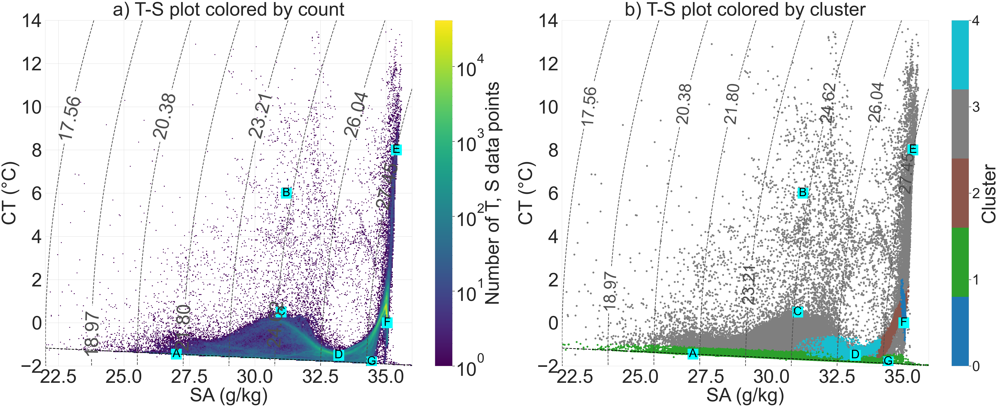

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import gsw

# Define SWT properties
values = {
    'ASW_T': -1.45, 'ASW_S': 27,
    'MsPW_T': 0.5, 'MsPW_S': 31,
    'sPW_T': 6, 'sPW_S': 31.2,
    'wPW_T': -1.5, 'wPW_S': 33.2,
    'NCW_T': 8, 'NCW_S': 35.4,
    'AW_T': 0, 'AW_S': 35.05,
    'BW_T': -1.8, 'BW_S': 34.45
}

# List of specific points
specific_points = [
    {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},
    {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},
    {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},
    {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},
    {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},
    {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},
    {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}
]

# Define plot grid
fig, ax = plt.subplots(1, 2, figsize=(60, 24)) 

# T-S scatter coloured by count (bivariate histogram)
hist = ax[0].hist2d(
    X_clusters_T_S_DO['absolute_salinity'], X_clusters_T_S_DO['conservative_temp'],
    bins=(np.linspace(22,36,400), np.linspace(-2,14,400)),
    cmap='viridis', norm=LogNorm()
)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22,36,400), np.linspace(-2,14,400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contours = ax[0].contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=3)
ax[0].clabel(contours, inline=True, fontsize=80)

# Add SWT markers
for point in specific_points:
    ax[0].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000)
    ax[0].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22,36,400), 0, 0)
ax[0].plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=3, label="Freezing Line")

# Labels, limits, title
ax[0].set_xlabel('SA (g/kg)', fontsize=80)
ax[0].set_ylabel('CT (°C)', fontsize=80)
ax[0].set_xlim([22,36])
ax[0].set_ylim([-2,14])
ax[0].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)
ax[0].set_title('a) T-S plot colored by count', fontsize=80, pad=20)
cbar = plt.colorbar(hist[3], ax=ax[0])
cbar.set_label('Number of T, S data points', fontsize=80)
cbar.ax.tick_params(labelsize=80, width=2, length=10)

# T-S scatter coloured by cluster
optimal_clusters = len(np.unique(labels))
cmap = plt.get_cmap('tab10', optimal_clusters)

sc = ax[1].scatter(
    X_clusters_T_S_DO['absolute_salinity'], X_clusters_T_S_DO['conservative_temp'],
    c=X_clusters_T_S_DO['cluster'], s=50, cmap=cmap,
    vmin=0, vmax=optimal_clusters-1
)

cbar = plt.colorbar(sc, ax=ax[1], ticks=range(optimal_clusters))
cbar.set_label('Cluster', fontsize=80)
cbar.ax.tick_params(labelsize=60, width=2, length=10)

# Sigma0 density contours
contours = ax[1].contour(SA, CT, sigma0, levels=levels, linestyles='--', colors='#4d4d4d', linewidths=3)
ax[1].clabel(contours, inline=True, fontsize=70)

# Add SWT markers
for point in specific_points:
    ax[1].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000)
    ax[1].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
ax[1].plot(np.linspace(22,36,400), CT_freezing, linestyle='--', color='black', linewidth=3, label="Freezing Line")

# Labels, limits, title
ax[1].set_xlabel('SA (g/kg)', fontsize=80)
ax[1].set_ylabel('CT (°C)', fontsize=80)
ax[1].set_xlim([22,36])
ax[1].set_ylim([-2,14])
ax[1].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)
ax[1].set_title('b) T-S plot colored by cluster', fontsize=80, pad=20)
ax[1].grid(False)

plt.tight_layout()
plt.show()

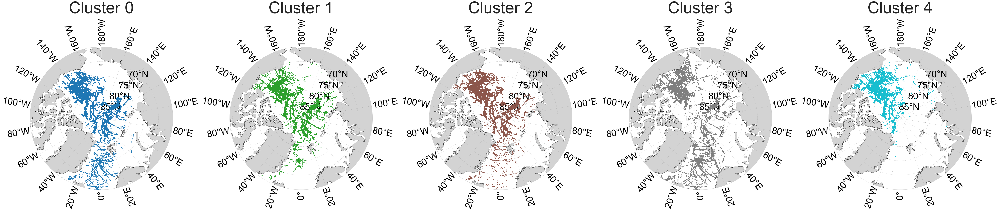

In [174]:
def plot_cluster_maps(data, num_clusters):
    # Create figure with subplots for each cluster
    fig, axes = plt.subplots(1, 5, 
                             figsize=(60, 30),
                             subplot_kw={'projection': ccrs.NorthPolarStereo()})
    axes = axes.flatten()

    # Define the same colormap and normalization as T-S plot
    cmap = plt.get_cmap('tab10', num_clusters)
    norm = plt.Normalize(vmin=0, vmax=num_clusters-1)

    for cluster in range(num_clusters):
        ax = axes[cluster]

        # Subset data for this cluster
        cluster_data = data[data['cluster'] == cluster]

        # Map setup
        ax.add_feature(cfeature.OCEAN, facecolor='white', zorder=1)
        ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2)
        ax.coastlines(resolution='50m', linewidth=0.5, zorder=3)
        gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', zorder=4)
        ax.set_extent([-180, 180, 65, 90], ccrs.PlateCarree())

        # Circle boundary
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Plot cluster points with matching color
        sc = ax.scatter(
            cluster_data['longitude'],
            cluster_data['latitude'],
            c=[cmap(norm(cluster))],  # Color corresponding to this cluster
            s=8,
            marker='x',
            transform=ccrs.PlateCarree(),
            zorder=6
        )

        # Title and grid label formatting
        ax.set_title(f'Cluster {cluster}', fontsize=70, pad=20)
        gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 20))
        gl.ylocator = mticker.FixedLocator(np.arange(65, 90, 5))
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {'size': 40, 'color': 'k'}
        gl.ylabel_style = {'size': 40, 'color': 'k'}

    plt.tight_layout()
    plt.show()

# Plot the clusters on maps
plot_cluster_maps(X_clusters_T_S_DO, optimal_clusters)

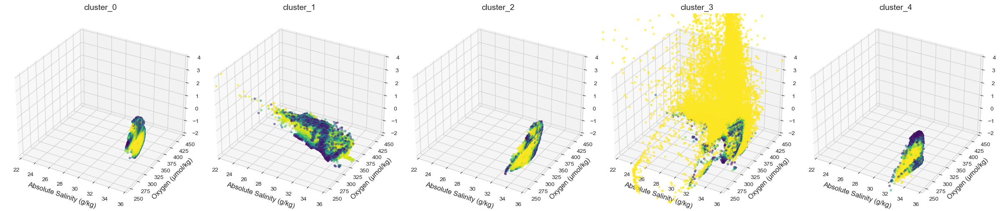

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np

def plot_T_S_DO_clusters(data, threshold):
    # Filter by threshold for each cluster
    high_cluster_0 = data[data['cluster_0'] > threshold]
    high_cluster_1 = data[data['cluster_1'] > threshold]
    high_cluster_2 = data[data['cluster_2'] > threshold]
    high_cluster_3 = data[data['cluster_3'] > threshold]
    high_cluster_4 = data[data['cluster_4'] > threshold]

    clusters = [
        (high_cluster_0, 'cluster_0'),
        (high_cluster_1, 'cluster_1'),
        (high_cluster_2, 'cluster_2'),
        (high_cluster_3, 'cluster_3'),
        (high_cluster_4, 'cluster_4')]
    
    
    # Create figure and subplots
    fig = plt.figure(figsize=(24, 18))

    for i, (cluster, label) in enumerate(clusters):
        ax = fig.add_subplot(1, 5, i+1, projection='3d')

        sc = ax.scatter(
            cluster['absolute_salinity'],
            cluster['oxygen'],
            cluster['conservative_temp'],
            c=cluster[label],
            cmap='viridis',
            s=10,
            alpha=0.5,
            vmin=threshold,
            vmax=1
        )
        
        ax.set_xlabel('Absolute Salinity (g/kg)', fontsize=12)
        ax.set_xlim([22, 36])  # Set x-axis limit for absolute salinity
        ax.set_ylabel('Oxygen (µmol/kg)', fontsize=12)
        ax.set_ylim([240, 450])  # Set y-axis limit for oxygen
        ax.set_zlabel('Conservative Temp (°C)', fontsize=12)
        ax.set_zlim([-2, 4])  # Set z-axis limit for conservative temperature
        ax.set_title(f'{label}', fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=10)

        # Colorbar for each subplot
        #cbar = fig.colorbar(sc, ax=ax, shrink=0.6, pad=0.1)
        #cbar.set_label('Cluster probability', fontsize=10)
        #cbar = plt.colorbar(sc, ax=ax[i])
        #cbar.set_label('Cluster probability')

    plt.tight_layout()
    plt.show()

# Run the plot function
plot_T_S_DO_clusters(X_clusters_T_S_DO, 0.5)




Compute EOFs for T and S separately

In [80]:
arctic_shallow = arctic[arctic['depth']<700]
arctic_shallow = arctic_shallow[['conservative_temp', 'absolute_salinity', 'oxygen', 'longitude', 'latitude', 'depth','source','nprof']].dropna()


In [81]:
# First make a unique profile ID
arctic_shallow['profile_id'] = arctic_shallow['source'].astype(str) + '_' + arctic_shallow['nprof'].astype(str)

# Pivot for conservative temperature
T_profiles = arctic_shallow.pivot_table(index='profile_id', columns='depth', values='conservative_temp')

# Pivot for absolute salinity
S_profiles = arctic_shallow.pivot_table(index='profile_id', columns='depth', values='absolute_salinity')

In [82]:
from sklearn.preprocessing import StandardScaler

# Standardize each depth column independently
T_scaled = pd.DataFrame(StandardScaler().fit_transform(T_profiles), 
                        index=T_profiles.index, columns=T_profiles.columns)

S_scaled = pd.DataFrame(StandardScaler().fit_transform(S_profiles), 
                        index=S_profiles.index, columns=S_profiles.columns)


In [84]:
from sklearn.decomposition import PCA

# Temperature EOFs
pca_T = PCA(n_components=2)
EOF_T_scores = pca_T.fit_transform(T_scaled)

# Salinity EOFs
pca_S = PCA(n_components=2)
EOF_S_scores = pca_S.fit_transform(S_scaled)

ValueError: Input X contains NaN.
PCA does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

**Questions**

EOF/PCAs:
1. Can I do this for my whole dataset? Surely given I have such a large region with different water mass regimes the EOFs will be different and the whole region-average won't make sense(?). 
2. How to deal with NaNs, especially in MOSAiC and UDASH.
3. Was Peisong's more suitable due to smaller region and more consistent data with just ITPs. 

Without EOFs/PCAs my data is not multivariate normal distributions (elliptical), so GMM isn't suitable? Also, I don't have distinct clusters, and instead have lots of mixed waters between extreme end members, so I don't think centroid clustering approaches are suitable.

**Density-based clustering**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame is called 'df'
X = arctic[['absolute_salinity', 'conservative_temp']].dropna().values  # Remove NaNs

# Standardise the data if scales are very different (optional here as they're both physical measurements, but can help DBSCAN)
from sklearn.preprocessing import StandardScaler
X_scaled = StandardScaler().fit_transform(X)

# Run DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=50)  # eps is the neighborhood radius, min_samples the min points to form a dense region
labels = dbscan.fit_predict(X_scaled)

# Add cluster labels back to DataFrame
df_clean = df[['absolute_salinity', 'conservative_temp']].dropna().copy()
df_clean['cluster'] = labels

# Plot the clustering result
plt.figure(figsize=(10,8))
sns.scatterplot(data=df_clean, x='absolute_salinity', y='conservative_temp', hue='cluster', palette='tab10', s=20)
plt.xlabel('Absolute Salinity (g/kg)')
plt.ylabel('Conservative Temperature (°C)')
plt.title('DBSCAN Clustering in T-S Space')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Cluster data**

In [154]:

# Select relevant columns
features = ['conservative_temp', 'absolute_salinity', 'oxygen']
X = sampled_data[features].dropna()  # Drop NaNs for clustering

# OPTIONAL: test method for 10% of data
#X = X.sample(frac=0.1, random_state=42)  

In [155]:
# Standardize the features

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# OPTIONAL: Reduce DO contribution
# X_scaled[:, 2] *= 1 / np.sqrt(3)  # index 2 is DO

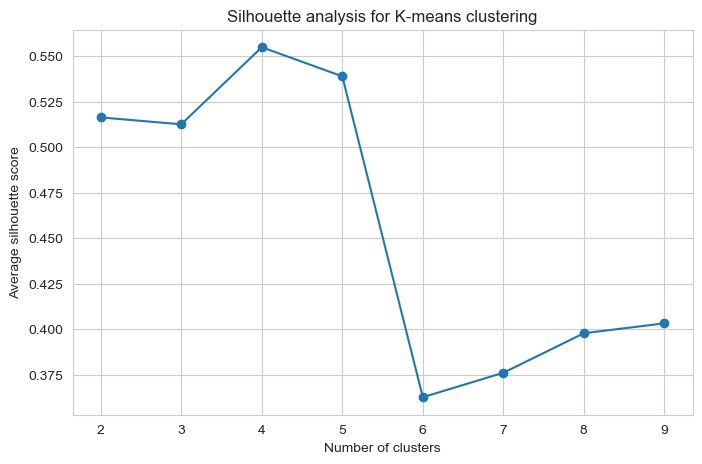

In [156]:
# Pick number of clusters using Silhouette score

range_n_clusters = range(2, 10)
silhouette_avg = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    silhouette_avg.append(silhouette_score(X_scaled, cluster_labels))

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, silhouette_avg, 'o-')
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette score')
plt.title('Silhouette analysis for K-means clustering')
plt.show()

In [157]:
# Final clustering using optimal number of clusters

optimal_clusters = 4  # or whatever the silhouette analysis suggests
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X['cluster'] = kmeans.fit_predict(X_scaled)

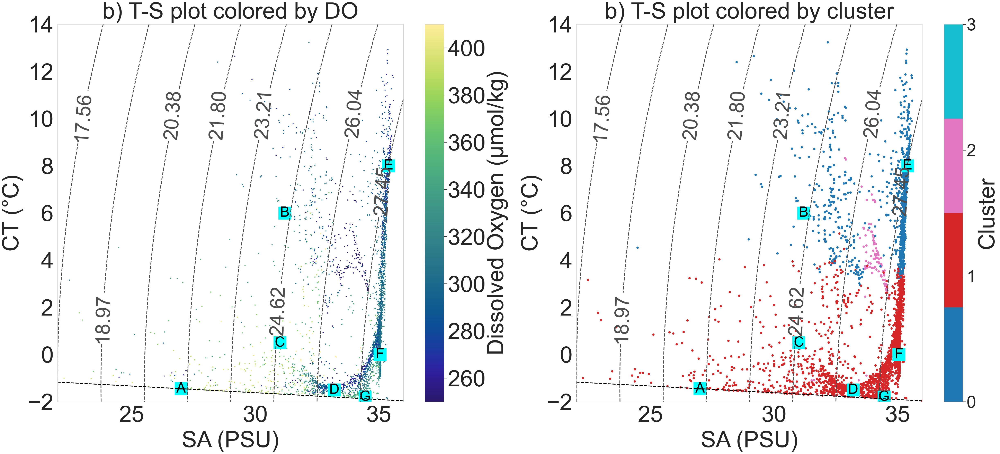

In [ ]:
# SWT properties

values = {
    'ASW_T': -1.45,#-1.35
    'ASW_S': 27,#25.5
    'ASW_O': 390.53,#367.25
    'MsPW_T': 0.5,
    'MsPW_S': 31,
    'MsPW_O': 354.21,
    'sPW_T': 6,
    'sPW_S': 31.2,
    'sPW_O': 314,
    'wPW_T': -1.5,
    'wPW_S': 33.2,
    'wPW_O': 280.84,
    'NCW_T': 8,#12
    'NCW_S': 35.4,
    'NCW_O': 287.82,#275.56
    'AW_T': 0,
    'AW_S': 35.05,
    'AW_O': 298,
    'BW_T': -1.8,
    'BW_S': 34.45,
    'BW_O': 370
}


fig, ax = plt.subplots(1, 2, figsize=(60, 24)) 

# First, plot the T-S scatter plot colored by DO

sc = ax[0].scatter(X['absolute_salinity'], X['conservative_temp'], c=X['oxygen'], s=10,cmap=cmo.haline, vmin=250, vmax=410)
cbar = plt.colorbar(sc)
cbar.set_label('Dissolved Oxygen (\u00b5mol/kg)', fontsize=80)
cbar.ax.tick_params(labelsize=80, width=2, length=10)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22, 36, 400), np.linspace(-2, 14, 400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contour = ax[0].contour(
    SA, CT, sigma0, levels=levels, 
    linestyles='--', colors='#4d4d4d', linewidths=3
)
ax[0].clabel(contour, inline=True, fontsize=70)

# Add SWTs
specific_points = [
    {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},     # Polar mixed layer
    {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},     # Pacific water
    {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},     # Pacific water
    {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},     # Pacific water
    {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},       # Atlantic water
    {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},     # Atlantic water warm
    {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}      # Barents Sea Water / cold halocline water
]
for point in specific_points:
    ax[0].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000, label=f"{point['label']} - {point['water_mass']}")
    ax[0].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

    # Add legend
    #ax.legend(loc='upper right', fontsize=60, facecolor='white', edgecolor='black', framealpha=1, bbox_to_anchor=(2.2, 1))

    # Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22, 36, 400), 0, 0)
ax[0].plot(
    np.linspace(22, 36, 400), CT_freezing, 
    linestyle='--', color='black', linewidth=3, label="Freezing Line"
)

# Labels and axis limits
ax[0].set_xlabel('SA (PSU)', fontsize=80, labelpad=15)
ax[0].set_ylabel('CT (\u00b0C)', fontsize=80, labelpad=15)
ax[0].set_xlim([22, 36])
ax[0].set_ylim([-2, 14])
ax[0].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)

# Add title
ax[0].set_title('b) T-S plot colored by DO', fontsize=80, pad=20)
    
# Remove grid
ax[0].grid(False)

# Second, plot the T-S scatter plot colored by cluster

# Choose a discrete colormap with enough distinct colors
cmap = plt.get_cmap('tab10', optimal_clusters)  # tab10 for up to 10 clusters, or tab20 for more

# Plot scatter with discrete colormap
sc = ax[1].scatter(
    X['absolute_salinity'],
    X['conservative_temp'],
    c=X['cluster'],
    s=50,
    cmap=cmap,
    vmin=0,
    vmax=optimal_clusters-1
)

# Colorbar with discrete ticks
cbar = plt.colorbar(sc, ax=ax[1], ticks=range(optimal_clusters))
cbar.set_label('Cluster', fontsize=80)  
cbar.ax.tick_params(labelsize=60, width=2, length=10)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22, 36, 400), np.linspace(-2, 14, 400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contour = ax[1].contour(
    SA, CT, sigma0, levels=levels, 
    linestyles='--', colors='#4d4d4d', linewidths=3
)
ax[1].clabel(contour, inline=True, fontsize=70)

# Add SWTs
for point in specific_points:
    ax[1].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000, label=f"{point['label']} - {point['water_mass']}")
    ax[1].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22, 36, 400), 0, 0)
ax[1].plot(
    np.linspace(22, 36, 400), CT_freezing, 
    linestyle='--', color='black', linewidth=3, label="Freezing Line"
)

# Labels and axis limits
ax[1].set_xlabel('SA (PSU)', fontsize=80, labelpad=15)
ax[1].set_ylabel('CT (\u00b0C)', fontsize=80, labelpad=15)
ax[1].set_xlim([22, 36])
ax[1].set_ylim([-2, 14])
ax[1].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)

# Add title
ax[1].set_title('b) T-S plot colored by cluster', fontsize=80, pad=20)

# Remove grid
ax[1].grid(False)

In [24]:
# Now do the same for weighting DO 3 times less than T and S

# Select relevant columns
features = ['conservative_temp', 'absolute_salinity', 'oxygen']
X = arctic[features].dropna()  # Drop NaNs for clustering

# OPTIONAL: test method for 10% of data
X = X.sample(frac=0.1, random_state=42)  

# Standardize the features

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#Reduce DO contribution
X_scaled[:, 2] *= 1 / np.sqrt(3)  # index 2 is DO



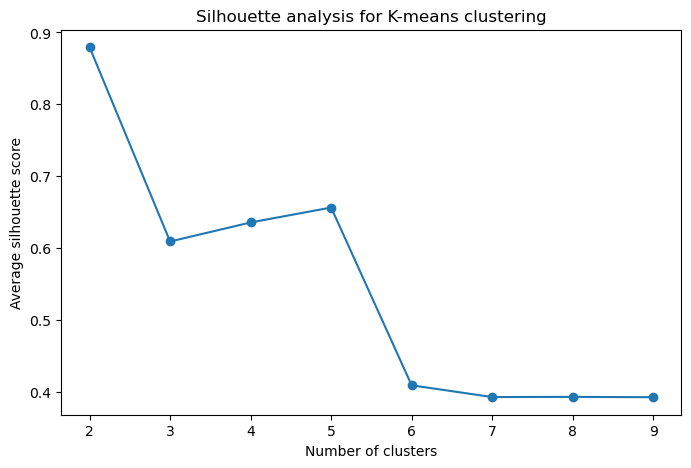

In [25]:
# Pick number of clusters using Silhouette score

range_n_clusters = range(2, 10)
silhouette_avg = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    silhouette_avg.append(silhouette_score(X_scaled, cluster_labels))

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(range_n_clusters, silhouette_avg, 'o-')
plt.xlabel('Number of clusters')
plt.ylabel('Average silhouette score')
plt.title('Silhouette analysis for K-means clustering')
plt.show()

In [ ]:
# Cluster 

# Final clustering using optimal number of clusters

optimal_clusters = 5  # or whatever the silhouette analysis suggests
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X['cluster'] = kmeans.fit_predict(X_scaled)

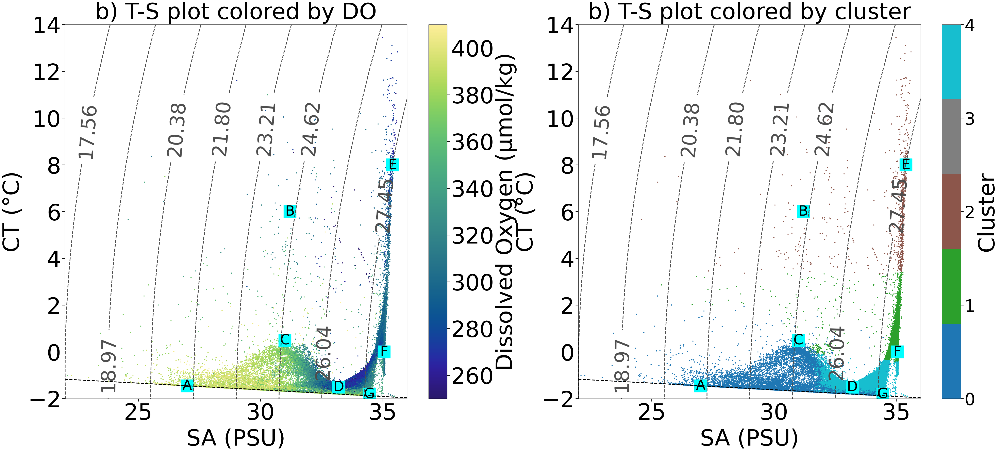

In [ ]:
# Plot

fig, ax = plt.subplots(1, 2, figsize=(60, 24)) 

# First, plot the T-S scatter plot colored by DO

sc = ax[0].scatter(X['absolute_salinity'], X['conservative_temp'], c=X['oxygen'], s=10,cmap=cmo.haline, vmin=250, vmax=410)
cbar = plt.colorbar(sc)
cbar.set_label('Dissolved Oxygen (\u00b5mol/kg)', fontsize=80)
cbar.ax.tick_params(labelsize=80, width=2, length=10)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22, 36, 400), np.linspace(-2, 14, 400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contour = ax[0].contour(
    SA, CT, sigma0, levels=levels, 
    linestyles='--', colors='#4d4d4d', linewidths=3
)
ax[0].clabel(contour, inline=True, fontsize=70)

# Add SWTs
specific_points = [
    {'label': 'A', 'absolute_salinity': values['ASW_S'], 'conservative_temp': values['ASW_T'], 'water_mass': 'Arctic Surface Water'},     # Polar mixed layer
    {'label': 'B', 'absolute_salinity': values['sPW_S'], 'conservative_temp': values['sPW_T'], 'water_mass': 'Alaskan Coastal Current Water'},     # Pacific water
    {'label': 'C', 'absolute_salinity': values['MsPW_S'], 'conservative_temp': values['MsPW_T'], 'water_mass': 'summer Pacific Water'},     # Pacific water
    {'label': 'D', 'absolute_salinity': values['wPW_S'], 'conservative_temp': values['wPW_T'], 'water_mass': 'winter Pacific Water'},     # Pacific water
    {'label': 'E', 'absolute_salinity': values['NCW_S'], 'conservative_temp': values['NCW_T'], 'water_mass': 'Norwegian Current Water'},       # Atlantic water
    {'label': 'F', 'absolute_salinity': values['AW_S'], 'conservative_temp': values['AW_T'], 'water_mass': 'Moderated Atlantic Water'},     # Atlantic water warm
    {'label': 'G', 'absolute_salinity': values['BW_S'], 'conservative_temp': values['BW_T'], 'water_mass': 'Brine-enriched Water'}      # Barents Sea Water / cold halocline water
]
for point in specific_points:
    ax[0].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000, label=f"{point['label']} - {point['water_mass']}")
    ax[0].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

    # Add legend
    #ax.legend(loc='upper right', fontsize=60, facecolor='white', edgecolor='black', framealpha=1, bbox_to_anchor=(2.2, 1))

    # Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22, 36, 400), 0, 0)
ax[0].plot(
    np.linspace(22, 36, 400), CT_freezing, 
    linestyle='--', color='black', linewidth=3, label="Freezing Line"
)

# Labels and axis limits
ax[0].set_xlabel('SA (PSU)', fontsize=80, labelpad=15)
ax[0].set_ylabel('CT (\u00b0C)', fontsize=80, labelpad=15)
ax[0].set_xlim([22, 36])
ax[0].set_ylim([-2, 14])
ax[0].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)

# Add title
ax[0].set_title('b) T-S plot colored by DO', fontsize=80, pad=20)
    
# Remove grid
ax[0].grid(False)

# Second, plot the T-S scatter plot colored by cluster

# Choose a discrete colormap with enough distinct colors
cmap = plt.get_cmap('tab10', optimal_clusters)  # tab10 for up to 10 clusters, or tab20 for more

# Plot scatter with discrete colormap
sc = ax[1].scatter(
    X['absolute_salinity'],
    X['conservative_temp'],
    c=X['cluster'],
    s=10,
    cmap=cmap,
    vmin=0,
    vmax=optimal_clusters-1
)

# Colorbar with discrete ticks
cbar = plt.colorbar(sc, ax=ax[1], ticks=range(optimal_clusters))
cbar.set_label('Cluster', fontsize=80)  
cbar.ax.tick_params(labelsize=60, width=2, length=10)

# Sigma0 density contours
SA, CT = np.meshgrid(np.linspace(22, 36, 400), np.linspace(-2, 14, 400))
sigma0 = gsw.sigma0(SA, CT)
levels = np.linspace(np.min(sigma0), np.max(sigma0), 10)
contour = ax[1].contour(
    SA, CT, sigma0, levels=levels, 
    linestyles='--', colors='#4d4d4d', linewidths=3
)
ax[1].clabel(contour, inline=True, fontsize=70)

# Add SWTs
for point in specific_points:
    ax[1].scatter(point['absolute_salinity'], point['conservative_temp'], marker='s', color='cyan', s=2000, label=f"{point['label']} - {point['water_mass']}")
    ax[1].text(point['absolute_salinity'], point['conservative_temp'], point['label'], ha='center', va='center', color='black', fontsize=50)

# Freezing line
CT_freezing = gsw.CT_freezing(np.linspace(22, 36, 400), 0, 0)
ax[1].plot(
    np.linspace(22, 36, 400), CT_freezing, 
    linestyle='--', color='black', linewidth=3, label="Freezing Line"
)

# Labels and axis limits
ax[1].set_xlabel('SA (PSU)', fontsize=80, labelpad=15)
ax[1].set_ylabel('CT (\u00b0C)', fontsize=80, labelpad=15)
ax[1].set_xlim([22, 36])
ax[1].set_ylim([-2, 14])
ax[1].tick_params(axis='both', which='major', labelsize=80, width=2, length=10)

# Add title
ax[1].set_title('b) T-S plot colored by cluster', fontsize=80, pad=20)

# Remove grid
ax[1].grid(False)

**Density-based clustering**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

In [7]:

import numpy as np
X = arctic.sample(frac=0.1, random_state=42) 
X_with_T_S = X[['conservative_temp', 'absolute_salinity','longitude', 'latitude', 'depth']].dropna().values  # shape (N, x)

In [8]:
# Standardize (zero mean, unit variance)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_with_T_S [:,[0, 1]])  # Only T and S for clustering

In [9]:
# DBSCAN clustering
#dbscan = DBSCAN(eps=0.3, min_samples=10)  # adjust eps as needed
#labels = dbscan.fit_predict(X_scaled)

# Agglomerative clustering (hierarchical)
hier = AgglomerativeClustering(n_clusters=7, linkage='ward')  # pick number of clusters to test
labels_hier = hier.fit_predict(X_scaled)
print(labels_hier)

# Add cluster labels to DataFrame
#df.loc[df[['SA', 'CT']].dropna().index, 'cluster_hier'] = labels_hier

: 